$\color{green}{\text{This notebook is best viewed in jupyter lab/notebook. You may also choose to use Google Colab but some parts of the images/colouring will not be rendered properly.}}$

# Lab 3 (Weeks 8,9): k-Means Clustering

<div class="alert alert-block alert-warning">

<b>Enter you credentials below</b>

- <b>Student Name:</b> Soham Phanse
- <b>Student ID:</b> 33698546
- <b>Date:</b> April 22, 2023


- Acknowledging use of generative AI
I have used generative AI for getting help in coding, basically in some functions of sklearn I did not know greatly of. Or where I had written code in for/while loops and was having difficulty in vectorising it in numpy.

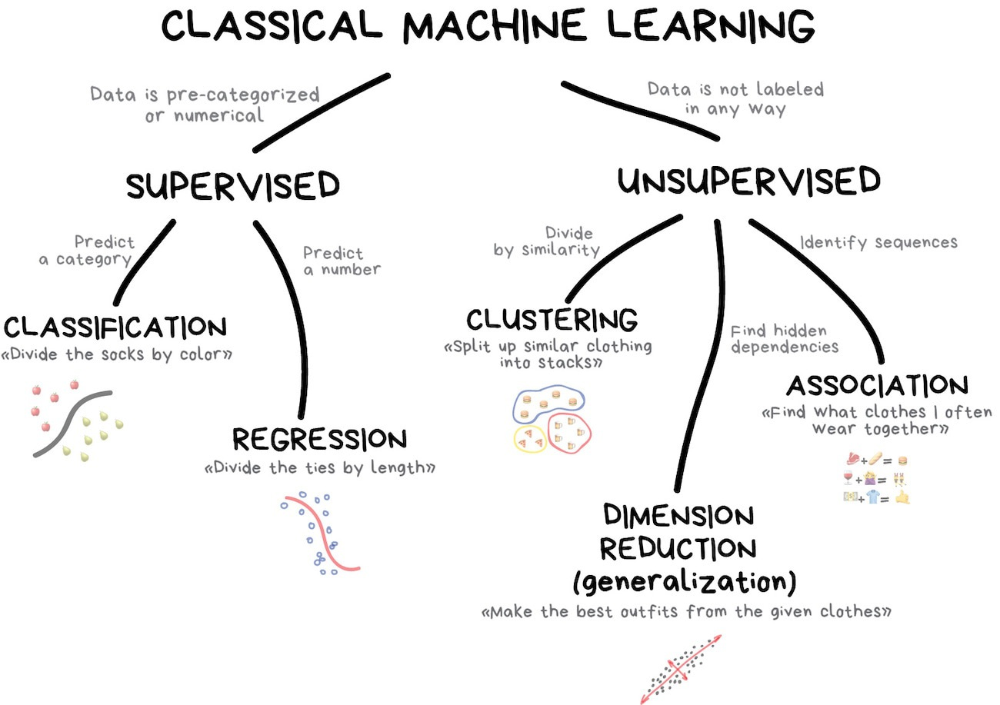

## Unsupervised Learning

As the name suggests, unsupervised learning is a type of machine learning in which the training of a model is not supervised using labels of the training dataset. Instead, models themselves attempt to find hidden patterns and insights from the given data. Unsupervised learning cannot be directly applied to a regression or classification problem because unlike supervised learning, we have the input data but no corresponding output data (no labels). The goal of unsupervised learning is to find the underlying structure of the dataset, group that data according to similarities, and represent the data in a compressed format.

## Clustering

Clustering is a type of unsupervised learning which involves grouping of data points. Given a set of data points, we can use a clustering algorithm to classify each data point into a specific group. In theory, data points that are in the same group should have similar properties and/or features, while data points in different groups should have highly dissimilar properties and/or features. Some examples of popular clustering algorithms are:
- __K-Means Clustering__
- __Mean-Shift Clustering__
- Spectral Clustering
- DBSCAN
- Gaussian Mixture Models (GMM)

In this lab, we will be implementing k-means clustering and mean-shift clustering on the same dataset.

## K-Means Clustering

K-Means Clustering is one of the simplest unsupervised machine learning algorithms. You will first decide a number *k*, which corresponds to the number of clusters that you desire to have in your dataset. This number will also correspond to the number of centroids. A centroid is the location representing the center of a cluster. Each data point in your dataset is allocated to a specific cluster following a set of rules in an iterative manner. Also, the locations of the centroids are updated subsequently by averaging the data points assigned to the respective cluster. The **‘means’** in the k-Means Clustering refers exactly to this method of updating each cluster centroid.

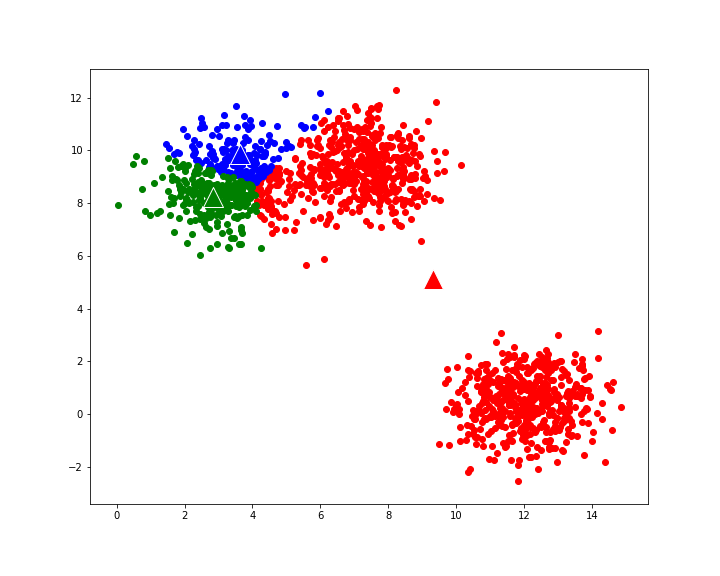

![kmeans_anim.gif](img/kmeans_anim.gif)

## What you should do in this lab exercise!

In this laboratory exercise, you will create a program that clusters and re-colours each pixel in a provided colour image to **k** mean colours using the k-means clustering algorithm. In all of the tasks below, you may not use any pre-written libraries for k-Means Clustering (e.g. **no** scikit-learn), instead you should use your knowledge of python and numpy to build your own code to perform k-Means Clustering. Your end result of the clustered image should look something like the one shown below.

*Note*: If you cannot see the displayed image '*objective_sharon.jpg*', have a look into the provided '*img*' folder.

![objective_sharon.jpg](img/objective_sharon.jpg)

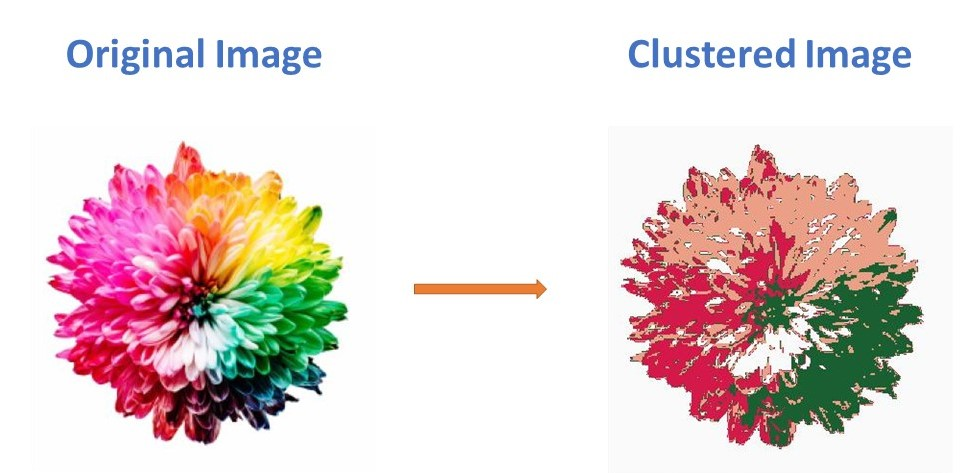

<div class="alert alert-block alert-warning">

You are going to work on the following six tasks throughout this lab. <span style="color:red"> </span>

- **Task 1** : Distance Function
- **Task 2** : k-Means Clustering and visualisation
- **Task 3** : k-Means++ Initialization
- **Task 4** : GMM: Analysing Data Distributions.
- **Task 5** : Mean Shift - Data Modelling via its distribution.
- **Task 6** : Comparison between k-Means, k-Means++ Initialization and Mean-Shift.

</div>

In [1]:
# As always, we first import several libraries that will be helpful to solve the tasks
# Important: You are only allowed to use cv2 to import images, but you may NOT use the contained k-means functionality
# For the GMM, you will run through the steps of understanding the model, then use a library to apply it to the same image from the k-means task

import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import numpy as np
import cv2
import time
import copy

from IPython.display import clear_output
from matplotlib.colors import ListedColormap

<div class="alert alert-block alert-info">

## Task 1: Distance function
In this task, you wil build a helper function to compute the squared distance from a set of data points to a set of mean values (*aka* centroids). You are given a small dataset of five data points and two centroids for testing. Using your 'dist2c' function, you will compute distances from each centroid to every data point. Finally, you will visualize your results and check whether your distances are correct by assigning the data points to the closest centroid and displaying the results.

</div>

Now, write your own **dist2c** function, which takes a set of data points ('*data*') and a set of means ('*centroids*') and computes the squared distance from each mean to every data point.

In [ ]:
def dist2c(data, centroids):
  # The inputs and the outputs of your function should be as follows:
  # Inputs - data      : numpy array of size N x d
  #          centroids : numpy array of size c x d
  # Output - dist      : numpy array of size c x N
  # N = the number of data points, c = the number of centroids, d = dimension of data

  ### Insert your solution here ###
  # store shapes of data and centroids arrays for various conditions
  # We know for sure that the number of columns for arrays data and centroids should be same

  # Condition 1: data array is m*1, so m 1 dimensional points, and centroids array is n*1
  # however arrays can have added empty dimensions
  ds, cs = np.shape(data), np.shape(centroids)
  lds, lcs = len(ds), len(cs)

  if lcs==1 and lds!=1:
    cr, cc = cs[0], 1
    dr, dc = ds
  elif lds==1 and lcs!=1:
    dr, dc = ds[0], 1
    cr, cc = cs
  elif lcs==1 and lds==1:
    cr, cc = cs[0], 1
    dr, dc = ds[0], 1
  if lcs!=1 and lds!=1:
    dr, dc = ds
    cr, cc = cs

  # create the distances matrix
  dist = np.zeros([dr, cr])

  for i in range(dr):
    for j in range(cr):
      dist[i, j] = np.linalg.norm(data[i]-centroids[j])

  return dist

In [ ]:
# this function calculates the closest centroid for every point and returns its index in the centroid array
# Input: Point to centroid Matrix
# Output: Index of the nearest centroid
def nearest_centroid(distmat, axis=1):

    # for every point, find which centroid is the closest
    minvals = np.min(distmat, axis)
    minvalis = np.argmin(distmat, axis)

    return minvals, minvalis

Now, let's check the function you wrote on the following provided data points.
- X contains five 3-dimensional data points

\begin{equation}
X =
\begin{bmatrix}
0.67187976 & 0.44254368 & 0.17900127\\
0.55085456 & 0.65891464 & 0.18370379\\
0.79861987 & 0.3439561  & 0.68334744\\
0.36695437 & 0.15391793 & 0.81100023\\
0.22898267 & 0.58062367 & 0.5637733
\end{bmatrix}
\end{equation}

- M contains two centroids
\begin{equation}
M =
\begin{bmatrix}
0.66441854 & 0.08332493 & 0.54049661\\
0.05491067 & 0.94606233 & 0.29515262
\end{bmatrix}
\end{equation}

Use your **dist2c** function to compute the distances from each centroid to every data point. Print your results. If you wrote the function correctly, your answer should be close to:

\begin{bmatrix}
0.25977266 & 0.47150141 & 0.10634496 & 0.16664051 & 0.43745224\\
0.64767303 & 0.34083498 & 1.0663305 & 0.99096278 & 0.23600355
\end{bmatrix}

In [ ]:
### Insert your solution here ###
X = np.array([[0.67187976, 0.44254368, 0.17900127],
              [0.55085456, 0.65891464, 0.18370739],
              [0.79861987, 0.3439561, 0.68334744],
              [0.36695437, 0.15391793, 0.81100023],
              [0.22898267, 0.58062367, 0.5637733]])

M = np.array([[0.66441854, 0.08332493, 0.54049661],
              [0.05491067, 0.94606233, 0.29515262]])

testdist = dist2c(X, M)
ncentroidsindex = nearest_centroid(testdist, axis=1)
print(testdist)
print(ncentroidsindex)

[[0.50967898 0.80478135]
 [0.68665773 0.58381005]
 [0.32610575 1.0326328 ]
 [0.40821626 0.99547113]
 [0.66140172 0.48580196]]
(array([0.50967898, 0.58381005, 0.32610575, 0.40821626, 0.48580196]), array([0, 1, 0, 0, 1]))


Write a code to draw a 3D scatter plot assigning each datapoint to its closest centroid using two colors.

*Hint*: Use the '*scatter3D*' function from matplotlib, and choose a different marker (or different marker size) to indicate the cluster centroids.

In [ ]:
def nnplot3D(X, M):

  xr, xc = np.shape(X)
  mr, mc = np.shape(M)
  clrs = np.array(['blue', 'red', 'green', 'violet', 'yellow','orange', 'black'])
  centclrs = ['yellow', 'black']

  # create the distance matrix using pre-written functions
  distmat = dist2c(X, M)
  ncentreval, ncentrindex = nearest_centroid(distmat, axis=1)

  fig = plt.figure()
  ax = fig.add_subplot(projection='3d')

  for j in range(mr):
    ax.scatter(*M[j], c=clrs[len(clrs)-j-1])

  for i in range(xr):
    ax.scatter(*X[i], c=clrs[i])
    ax.plot3D(*zip(X[i], M[ncentrindex[i]]), c=centclrs[ncentrindex[i]])

  ax.set_title('Nearest Centroids')
  ax.set_xlabel('X')
  ax.set_ylabel('Y')
  ax.set_zlabel('Z')

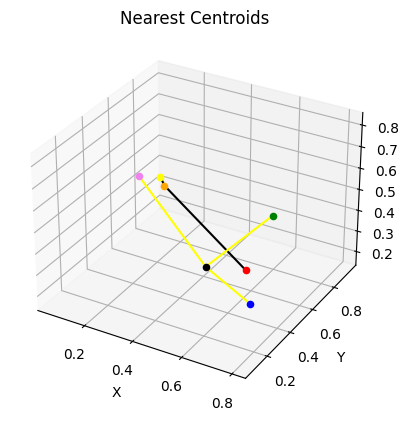

In [ ]:
nnplot3D(X, M)

<div class="alert alert-block alert-success">

#### What do you observe here? Are the data points assigned to their closest centroid?

Write your answer here:

1. The algorithm iterates over centroids and updates the centroids based on the sum of distances of every point alloted to that cluster.

2. The algorithm assigns every point to the nearest centroids in the dataset. However from the plot it is not entirely clear, because it cannot be visually calculated from the graph.

</div>

<div class="alert alert-block alert-info">

## Task 2: K-means Clustering
In this task, you will implement k-Means Clustering. First, you will write a function to generate random centroids for initialization. Then you will write a function to perform k-Means Clustering (You may want to follow the steps on the lab instructions sheet). Afterwards, you will use these functions to cluster the pixels of the provided *sharon.jpg* image. Finally, you will display the results.

</div>

Write a function **random_centroids**, which takes a dataset and an integer value k (= number of centroids) as inputs, and generates k number of _centroids_ which are randomly sampled from the dataset.

In [ ]:
def random_centroids(data, k):
    # The inputs and the outputs of your function should be as follows:
    # Inputs - data     : numpy array (N x d)
    #        - k        : an integer value
    # Output - centroids: numpy array (k x d)
    # N = number of data points, d = dimension of data, k = number of centroids

    ### Insert your solution here ###

    # first generate k random indices (these will be used to pick the random centroids)
    N, d = np.shape(data)

    # create centroids array to store points
    centroids = np.zeros([k, d])
    random_index = np.random.choice(N, k, replace=False)

    for i in range(k):
      centroids[i] = data[random_index[i]]

    return centroids

Write a function **mykMeans**, which takes a dataset, an set of k centroids and an integer value T (= number of iterations) as inputs. The function should perform k-Means Clustering on the input dataset by using the input centroids as intilization. After running for T iterations, the function should finally output a cluster index for each data point, the final set of k centroids, and the loss vector containing the k-Means loss at each iteration. (You may want to use your function **dist2c** to compute distances between centroids and data points at each iteration.)

In [ ]:
# this function finds the data points which are associated with a particular cluster
# input:
#1 ncia = array containing the index of the closest centroid for every point in data
#2 k = number of centroids

# output:
#1 array containing indices of data points closest to a particular centroid
#2 each element is itself an array

def find_datapts(ncia, k):

  # make a local copy of ncia
  ncia2 = copy.deepcopy(ncia)

  # create a list to store indexes of data points pertaining to each centroid
  datapts = []

  # parse the range of possible cluster IDs
  for cluster_id in range(k):

    # create a buffer list for this particular cluster ID
    buffer = []

    # now check every element of ncia
    for i in range(len(ncia2)):

      if ncia2[i]==cluster_id:
        buffer.append(i)

    # entire ncia2 parsed for cluster_id, now append buffer to global list
    datapts.append(buffer)
    buffer = []

  return datapts

In [ ]:
# this function computes the loss in teh Kmeans clusterting method
# Input
#1 centroids: the co-ordinates of the centroids, k * d
#2 cluster data: array containing the set of indices of data points close to a particular centroid

# Output
#1 'loss' array: array of sum of squared distances from every data point to its associated centroid

def kmeansloss(data, cluster_data, centroids):

  N, d = np.shape(data)
  k, d = np.shape(centroids)

  # create the losses array, measuring equal to number of centroids
  loss = np.zeros(k)

  # parse over each centroid
  for i in range(k):

    # collect all the associated data points indices
    indices = cluster_data[i]

    # parse over each data point and add to the loss function
    for j in indices:
      loss[i] += np.linalg.norm(data[j] - centroids[i])**2

  return loss

In [ ]:
# this function calculates a mean of data points, each having d dimensions, given their indices and source array
def datamean(arr, indices):
    return np.mean(arr[indices], axis=0)

In [ ]:
def mykMeans(data, centroids, T, og_imshape):
    # The inputs and the outputs of your function should be as follows:
    # Inputs  - data        : numpy array (N x d)
    #         - centroids   : numpy array (k x d)
    #         - T           : integer
    #         - og_imshape  : numpy array (a x b x 3)
    # Outputs - cluster_idx : numpy array (N,)
    #         - centroids   : numpy array (k x d)
    #         - losses      : list (T)
    # N = number of data points, d = dimension of data, k = number of centroids, T = number of iterations
    # a = height of the original image, b = width of the original image

    ### Insert your solution here ###

    N, d = data.shape
    k, d = centroids.shape
    kmloss = np.zeros([T, k])
    store_centroids = np.zeros([T, k, d])
    # Here's the process we follow:

    #7 repeat for T iterations

    for i in range(T):
      
      #1 Create the point-centroid distance matrix
      distmat = dist2c(data, centroids) # self.distmat

      #2 For every point, find the closest centroid
      #3 Assign the point with that particular centroid cluster index
      cluster_val, cluster_idx = nearest_centroid(distmat, axis=1) # self.cluster_data

      #4 For every centroid, find all the data points which belong to its cluster
      cluster_data = find_datapts(cluster_idx, k) # cluster_idx = self.cluster_idx, cluster_data = self.datapts

      #5 Take average of the data points
      ## create array to store the average, now we have k clusters, hence there will be k averages
      averages = np.zeros([k, d])
      for j in range(k):
        averages[j] = np.mean(data[cluster_data[j]], axis=0)

      store_centroids[i] = averages

      #6 update the centroid with the new average
      centroids = averages

      # calculate kMeans_loss for every iteration
      kmloss[i] = kmeansloss(data, cluster_data, centroids)

    return cluster_idx, centroids, kmloss, store_centroids

Load the *sharon.jpg* image and display it.

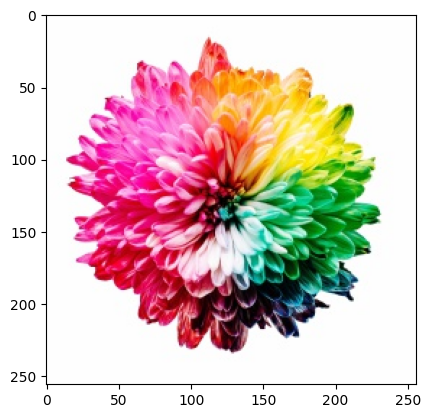

In [ ]:
### Insert your solution here ###

# Load and display the colour (!) image
img = cv2.cvtColor(cv2.imread('sharon.jpg'), cv2.COLOR_BGR2RGB)
plt.imshow(img);

Now, use your **random_centroids** function to generate four random centroids. Then, use your **mykMeans** function to cluster the pixels of the *sharon.jpg* image by running it for 20 iterations (T=20). (*Hint*: You may want to reshape your image before applying the **mykMeans** function.) </br> Display the final clustered image. Each pixel should be displayed by the colour of the assigned centroid (i.e. you should only see a total of *k* colours in your clustered image).

In [ ]:
# Define a fixed random seed for repeatability
np.random.seed(17)

### Insert your solution here ###
# Initialize centroids, perform k-means for 20 iterations and visualise the clustered colour image
# before that, first reshape the image

# Reshaping the image into a 2D array of pixels and 3 color values (RGB)
img2d = img.reshape((-1,3))

# Convert to float type
img2d = np.float32(img2d)

sharon_centroids = random_centroids(img2d, 4)

sharon_clusterIDs, sharon_centroids, sharon_losses, store_centroids = mykMeans(img2d, sharon_centroids, 20, np.shape(img))

In [ ]:
sharon_centroidsxy = random_centroids(img2d, 2)
sharon_centroidsab = random_centroids(img2d, 3)

In [ ]:
sharon_clusterIDsxy, sharon_centroidsxy, sharon_lossesxy, store_centroidsxy = mykMeans(img2d, sharon_centroidsxy, 20, np.shape(img))
sharon_clusterIDsab, sharon_centroidsab, sharon_lossesab, store_centroidsab = mykMeans(img2d, sharon_centroidsab, 20, np.shape(img))

<ipython-input-16-9c6f57246cb1>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10', k);


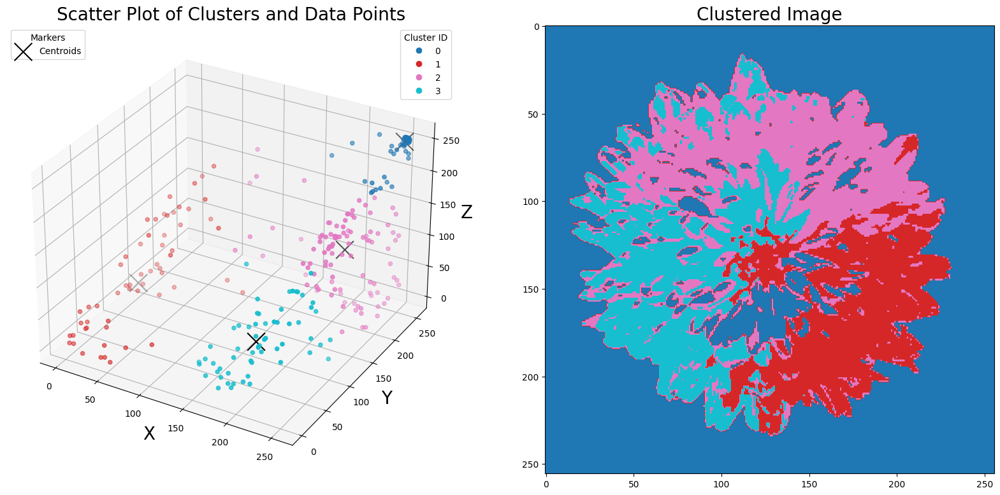

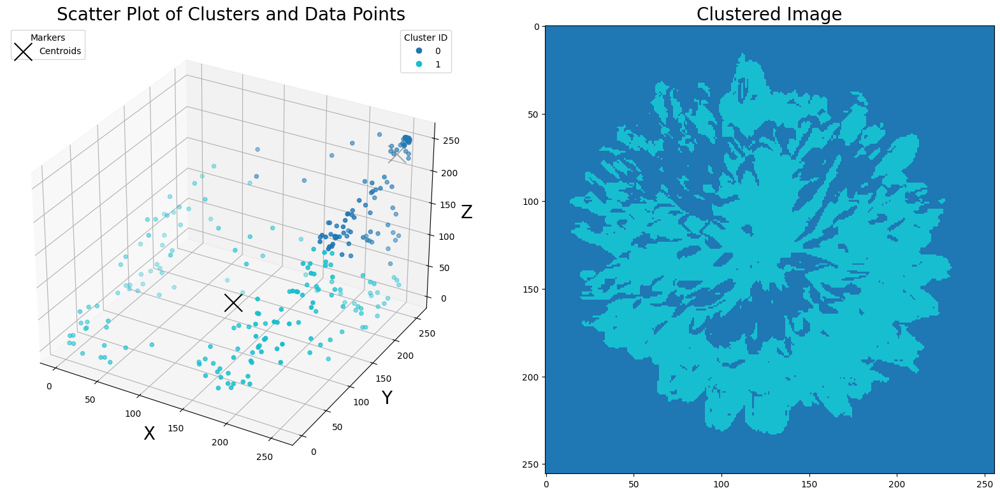

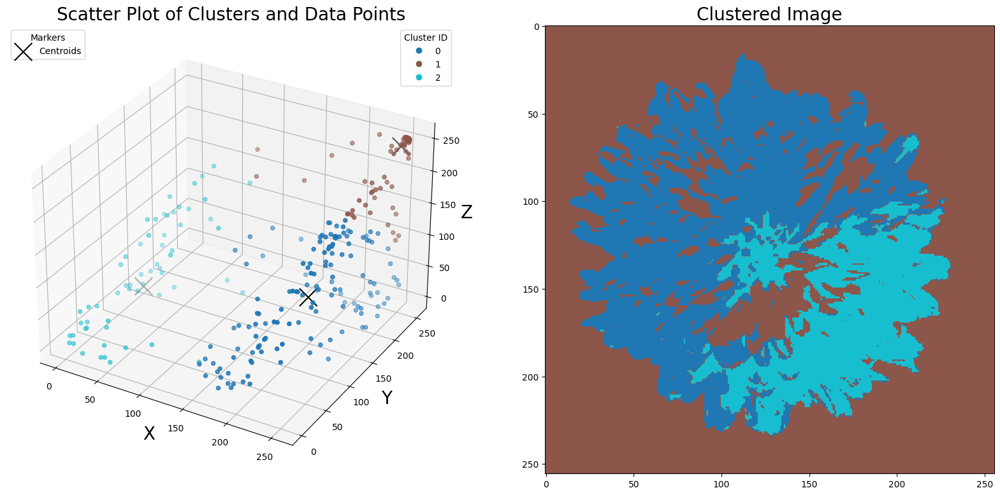

In [ ]:
sample = np.random.choice(np.arange(img2d.shape[0]), size=500, replace=False)
visualize(img2d, sharon_clusterIDs, sharon_centroids, sample, np.shape(img))
visualize(img2d, sharon_clusterIDsxy, sharon_centroidsxy, sample, np.shape(img))
visualize(img2d, sharon_clusterIDsab, sharon_centroidsab, sample, np.shape(img))

<div class="alert alert-block alert-success">

#### Have some fun with your k-Means Clustering impementation! Run the program several times with different random seeds to see if you always converge to the same solution. Try changing k from 4 to other numbers (from 2 to 10) and see how this affects the output and the repeatability of the program. Report and discuss your observations.

1. We used the kmeans clustering operation on the image with different number of clusters 2, 3, 4.
2. The k means algorithm creates the initial centroids with a random process. Hence the solutions/clusters are very sensitive to the initial seed. Different random initializations can lead to different centroids, however with sufficient iterations the solutions eventually converge to the same point.
3. It takes longer to process when the number of clusters is higher.
4. When k is a small value, the solution converges quickly since there are only a few clusters to separate. Hence the number of iterations can be kept low for obtaining a reasonable accuracy.
5. However, convergence is much more difficult when the number of centroids/clusters is high.
6. Furthermore, a very low number of k leads to the problem of underfitting. In this case, all the image clusters are not well-resolved.
7. In case of high, the problem of overfitting happens, where there are too many clusters and too few data points per cluster.
</div>

Now, visualize how the centroids are updated during k-Means Clustering. For that, you should write a code to plot the data points along with the centroids and display both the plot and the clustered image side-by-side. Then, use that function inside your k-Means Clustering implementation to observe how the centroids move with each iteration.



Write your own function **visualize** which takes the dataset, cluster indices, centroids and sample indices, and generates a figure of two subplots:
1. A 3D scatter plot of the datapoints and centroids.
2. A display of the clustered image

For the 3D scatter plot, the colour of each data point should reflect the colour of the closest centroid (i.e. the centroid which it is assigned to). As it is computationally expensive to plot all the data points at each iteration, you may only draw 250 randomly selected data points (to speed things up).

In [ ]:
def visualize(data, cluster_idx, centroids, sample_idx, og_imshape):
    # The inputs and the outputs of your function should be as follows:
    # Inputs  - data        : numpy array (N x d)
    #         - cluster_idx : numpy array (N,)
    #         - centroids   : numpy array (k x d)
    #         - sample_idx  : numpy array (250,)
    #         - og_imshape  : numpy array (a x b x 3)
    # Outputs - figure      : subplot (1, 2)
    # N = number of data points, d = dimension of data, k = number of centroids
    # a = height of the image    b = width of the image

    k, d = np.shape(centroids)

    ### Insert your solution here ###
    # first create a figure and set projection axes as 3D
    fig = plt.figure(figsize=(20, 10))
    ax1 = fig.add_subplot(121, projection='3d')
    ax2 = fig.add_subplot(122)

    # create the colors array as per the number of centroids
    #colors = plt.cm.get_cmap('tab20', k)
    #cmap = ListedColormap([colors(i) for i in range(k)])
    cmap = plt.cm.get_cmap('tab10', k);

    # create the sample from 'data' and sample_idx
    sample = data[sample_idx]
    cluster_idsample = cluster_idx[sample_idx]

    # Create 3D scatter plot with corresponding colours as first sub-plot
    scatter_plot = ax1.scatter(sample[:, 0], sample[:, 1], sample[:, 2], c=cluster_idsample, cmap=cmap)
    centroids_plot = ax1.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], s=400, c='black', marker='x')
    legend1 = ax1.legend(*scatter_plot.legend_elements(), loc="upper right", title="Cluster ID")
    legend2 = ax1.legend([centroids_plot], ['Centroids'], loc="upper left", title="Markers")
    ax1.set_title('Scatter Plot of Clusters and Data Points', size=20)
    ax1.add_artist(legend1)
    ax1.set_xlabel('X', size=20)
    ax1.set_ylabel('Y', size=20)
    ax1.set_zlabel('Z', size=20)

    # Create visualization of the clustered image as second sub-plot

    # the array 'cluster_idx' is sufficient for plotting the clustered image
    ## reshape the cluster_idx into the original image shape
    clustered_image = cluster_idx.reshape(og_imshape[:2])

    ## plot
    ax2.imshow(clustered_image, cmap=cmap)
    ax2.set_title('Clustered Image', size=20)

<ipython-input-16-9c6f57246cb1>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10', k);


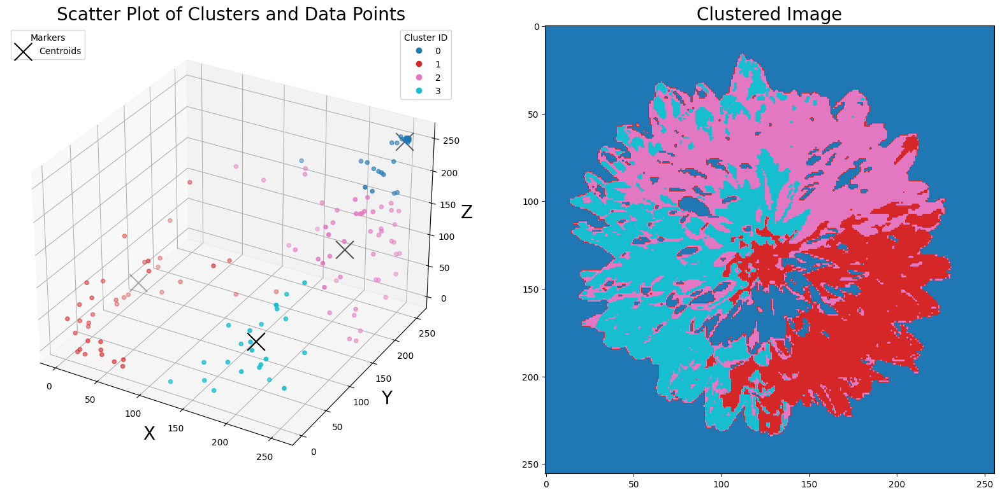

In [ ]:
sample = np.random.choice(np.arange(img2d.shape[0]), size=250, replace=False)
visualize(img2d, sharon_clusterIDs, sharon_centroids, sample, np.shape(img))

Now modify your **mykMeans** function and create a new **myKMeans_visualize** function by adding the **visualize** function that you wrote above in order to visualize the results at every iteration.

Make sure you add a time pause of 1-2 seconds after each iteration so there is enough time for you to observe the convergence of the centroids clearly! *Hint*: the '*time*' library we imported at the beginning provides a '*sleep*' function!

In [ ]:
def mykMeans_visualize(data, centroids, T, og_imshape):
    # The inputs and the outputs of your function should be as follows:
    # Inputs  - data        : numpy array (N x d)
    #         - centroids   : numpy array (k x d)
    #         - T           : integer
    #         - og_imshape  : numpy array (a x b x 3)
    # N = number of data points, d = dimension of data, k = number of centroids, T = number of iterations
    # a = height of the original image, b = width of the original image

    ### Insert your solution here ###
    N, d = data.shape
    k, d = centroids.shape
    kmloss = np.zeros([T, k])
    store_centroids = np.zeros([T, k, d])
    # Here's the process we follow:

    #7 repeat for T iterations

    for i in range(T):
      #1 Create the point-centroid distance matrix
      distmat = dist2c(data, centroids)

      #2 For every point, find the closest centroid
      #3 Assign the point with that particular centroid cluster index
      cluster_val, cluster_idx = nearest_centroid(distmat, axis=1)

      #4 For every centroid, find all the data points which belong to its cluster
      cluster_data = find_datapts(cluster_idx, k)

      #5 Take average of the data points
      ## create array to store the average, now we have k clusters, hence there will be k averages
      averages = np.zeros([k, d])
      for j in range(k):
        averages[j] = np.mean(data[cluster_data[j]], axis=0)

      store_centroids[i] = averages

      #6 update the centroid with the new average
      centroids = averages

      #7 visualize the results
      # create a random sample
      sample = np.random.choice(np.arange(data.shape[0]), size=250, replace=False)
      visualize(data, cluster_idx, centroids, sample, og_imshape)

      time.sleep(2)

      # calculate kMeans_loss for every iteration
      kmloss[i] = kmeansloss(data, cluster_data, centroids)

    return cluster_idx, centroids, kmloss, store_centroids

Test your new **myKMeans_visualize** function on the *sharon.jpg* image.

<ipython-input-16-9c6f57246cb1>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10', k);


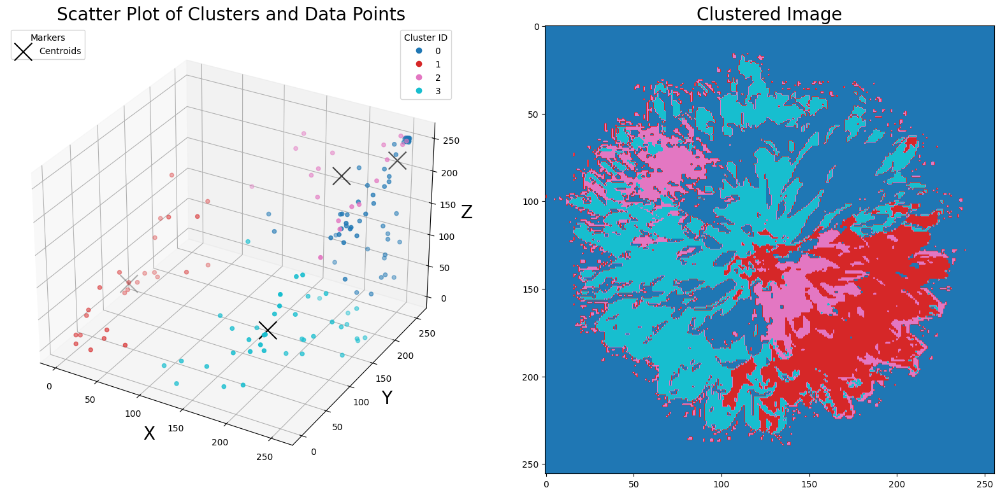

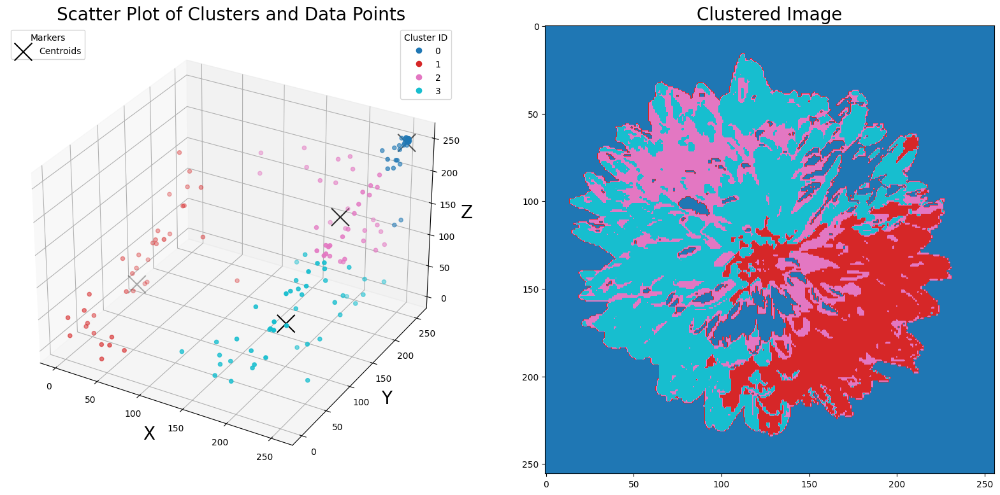

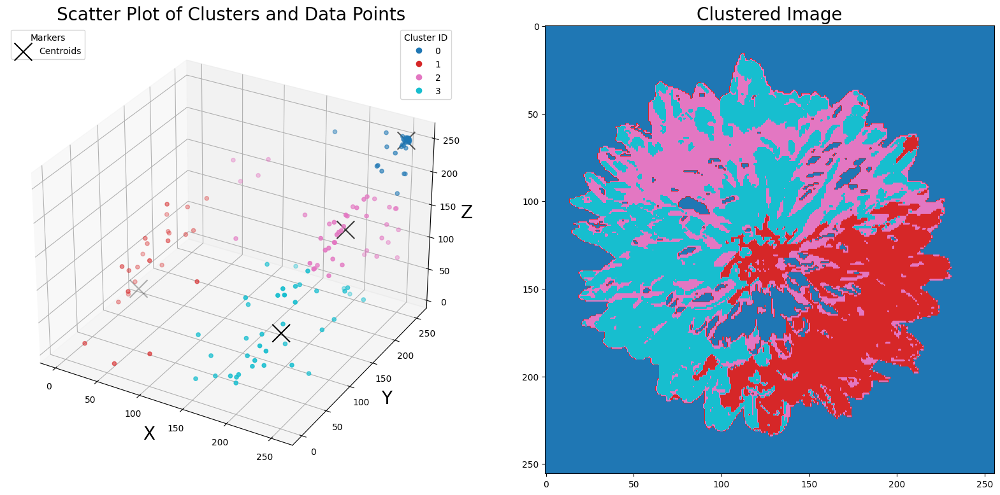

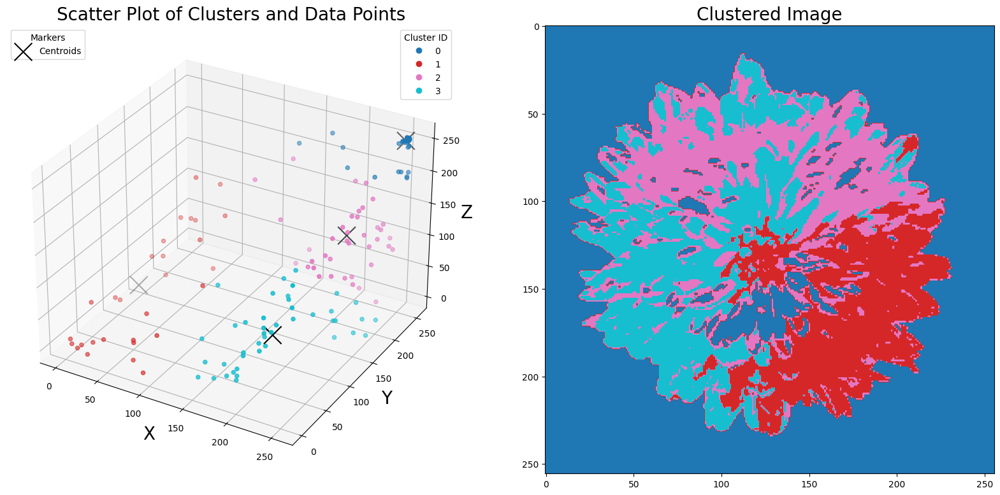

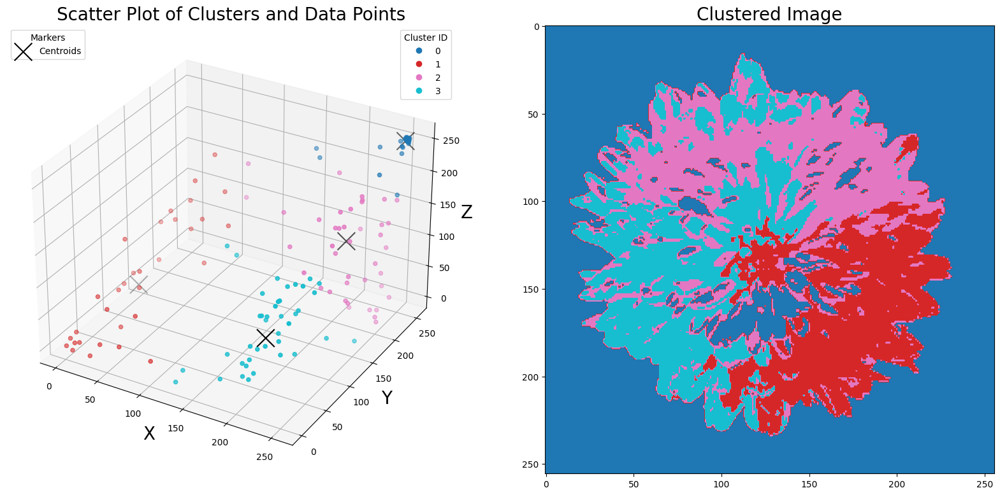

...

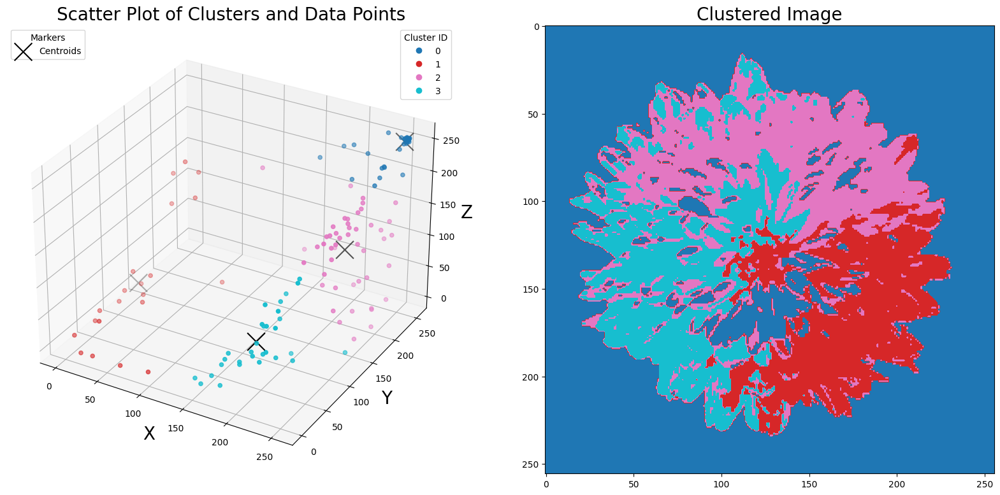

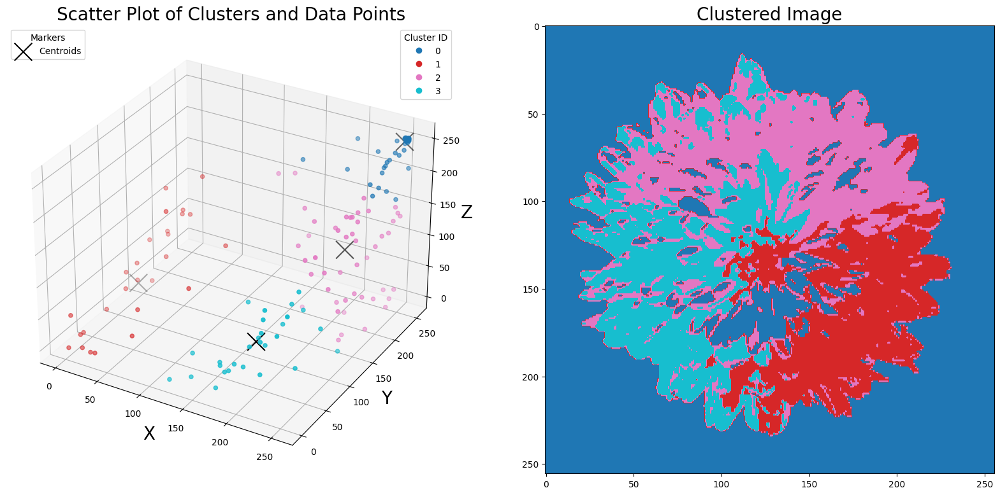

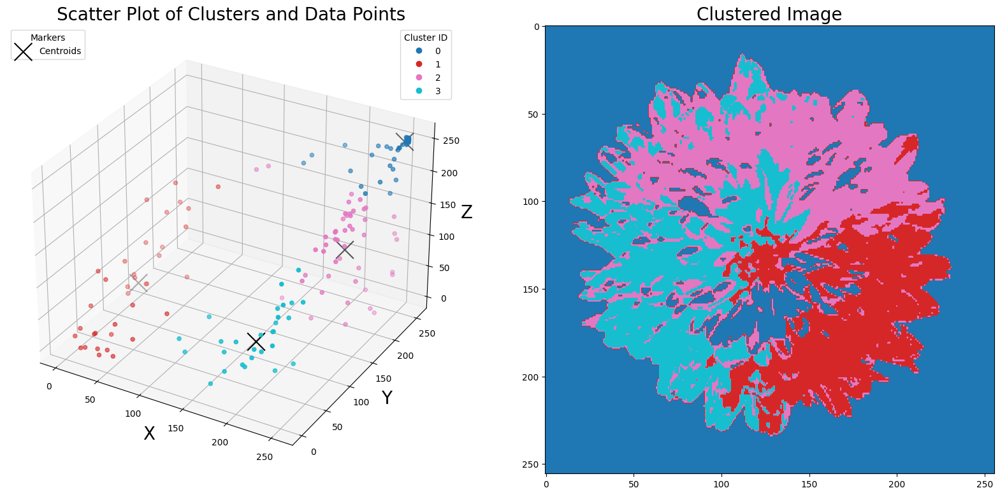

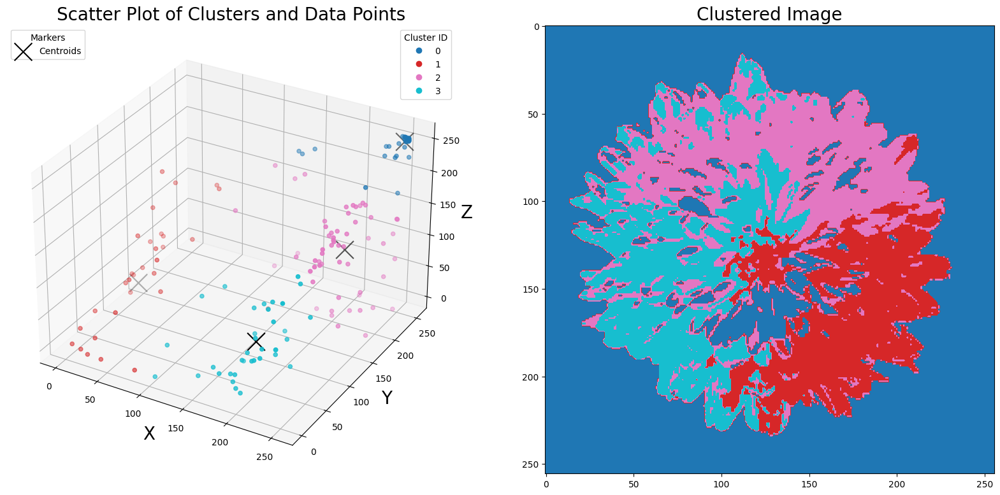

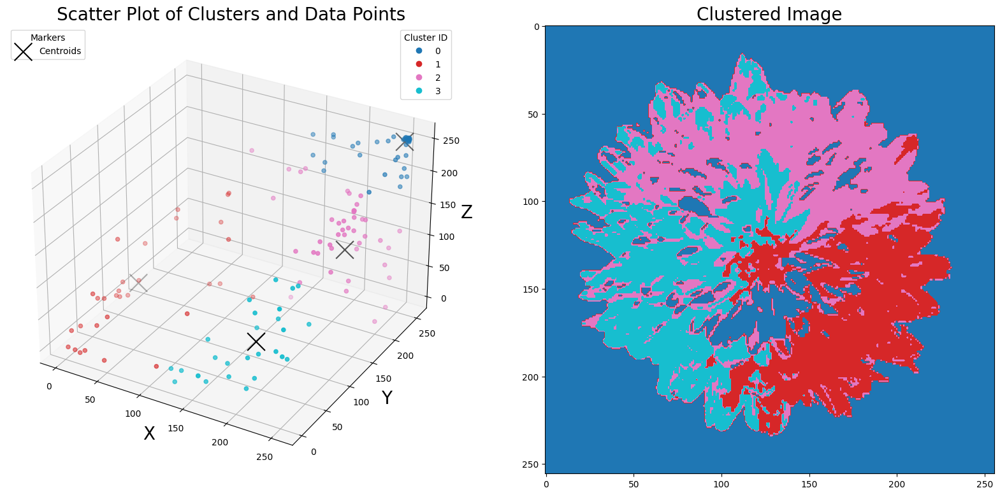

In [ ]:
# Specify a random seed (will determine the random initialisation)
np.random.seed(17)

# Initialise your centroids and run your k-Means visualization function
# Initialize centroids, perform k-means for 20 iterations and visualise the clustered colour image
# before that, first reshape the image

# Reshaping the image into a 2D array of pixels and 3 color values (RGB)
img2d = img.reshape((-1,3))

# Convert to float type
img2d = np.float32(img2d)

sharon_centroids = random_centroids(img2d, 4)

sharon_clusterIDs2, sharon_centroids2, sharon_losses2, store_centroids2 = mykMeans_visualize(img2d, sharon_centroids, 20, np.shape(img))

<div class="alert alert-block alert-success">

#### Observe how the centroids move with each iteration. Did you see any pattern in the movement of each centroid? Report and discuss your observations!


1. In general, the initial centroids are initialized randomly.
2. The centroids move in each iteration as the algorithm assigns the data points to that centroid and computes the new centroids.
3. The movement will in general depend on the initial position of centroids, the data and the number of iterations.
4. Overall, the centroids, in subsequent iterations, the centroids move towards the geometric center of the cluster. If the clusters are very close by to each other, then the centroids may move a lot, as the algorithm tends to separate out the clusters in the best possible way.
5. However if the clusters are already well separated, then the centroids don't move a lot in subsequent iterations.

</div>

<div class="alert alert-block alert-info">

## Tasks 3: k-Means++ Initialization

In this task, you will implement the k-Means++ initialization of the k-Means Clustering algorithm. First, you will write a function to generate centroids for the initialization using the k-Means++ initialization procedure (You may want to follow the steps on the lab instructions sheet, and read up on the method using the provided reference).

Then you will use the generated initial centroids together with your previous k-Means Clustering implementation to cluster the pixels of the *sharon.jpg* image. Finally, you will display the results.

</div>

Write a function **kmeanspp_centroids**, which takes a dataset and an integer value k (= number of centroids) as inputs, and generates k centroids following the k-Means++ initilization procedure. You might want to re-use your **dist2c** function here.

In [ ]:
def kmeanspp_centroids(data,k):
    # The inputs and the outputs of your function should be as follows:
    # Inputs - data     : numpy array (N x d)
    #        - k        : an integer value
    # Output - centroids: numpy array (k x d)
    # N = number of data points, d = dimension of data, k = number of centroids

    ### Insert your solution here ###

    N, d = np.shape(data)

    #Step 1: Generate the first centroid
    c1 = data[np.random.choice(np.arange(N))]
    print(c1)

    ## Step 1.1 Find the index of c1 in data
    c1index = np.where((data == c1).all(axis=1))[0][0]

    # Step 2: Create an array to store the centroids so far, and store the first centroid
    centroids = np.zeros([k, d])
    centroids[0] = c1

    # Step 3:Compute the squared distance between c1 and every other data point
    distances = dist2c(data, c1)
    sqdistances = distances**2

    # Step 4: Now create the loop according to the number of centroids required
    for i in range(1, k):

      # Step 5: Minimum value of squared distances from each of the centroid
      minvals, minvalsindex = nearest_centroid(sqdistances)
      minvalssum = np.sum(minvals)

      # Step 6: Compute the probability values
      probability = minvals/minvalssum

      # Step 7: Choose a new centroid and store it based on probability distribution
      centroids[i] = data[np.random.choice(np.arange(N), p=probability)]

      # Step 8: Update the distance matrix
      distances = dist2c(data, centroids[:i+1])
      sqdistances = distances**2

    return centroids

Now, use your **kmeanspp_centroids** function to generate four random centroids. Then, use your **mykMeans** function to cluster the pixels of the *sharon.jpg* image. (You may want to reshape your image before applying the **mykMeans** function.) Display the final clustered image.

[255. 160. 171.]
[[255. 160. 171.]
 [227. 116. 193.]
 [ 13.   1.   3.]
 [254. 254. 254.]]


<ipython-input-16-9c6f57246cb1>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10', k);


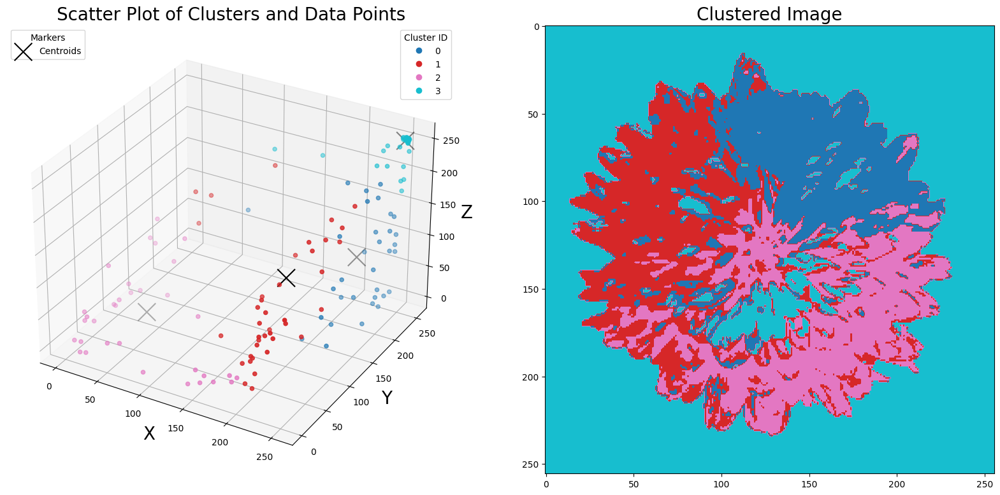

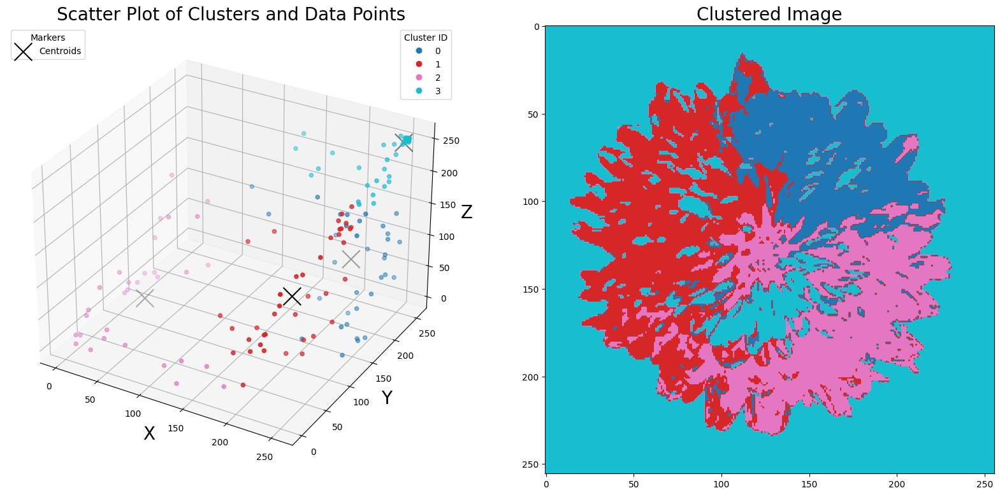

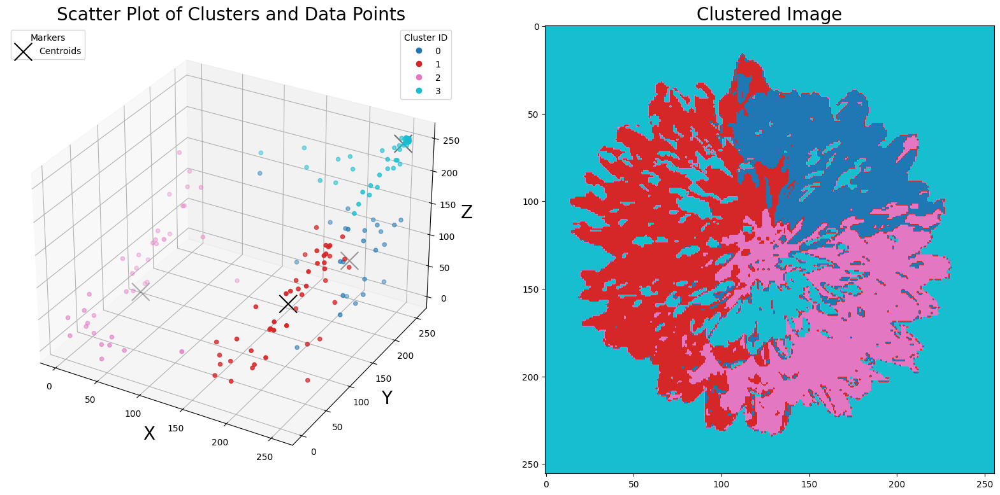

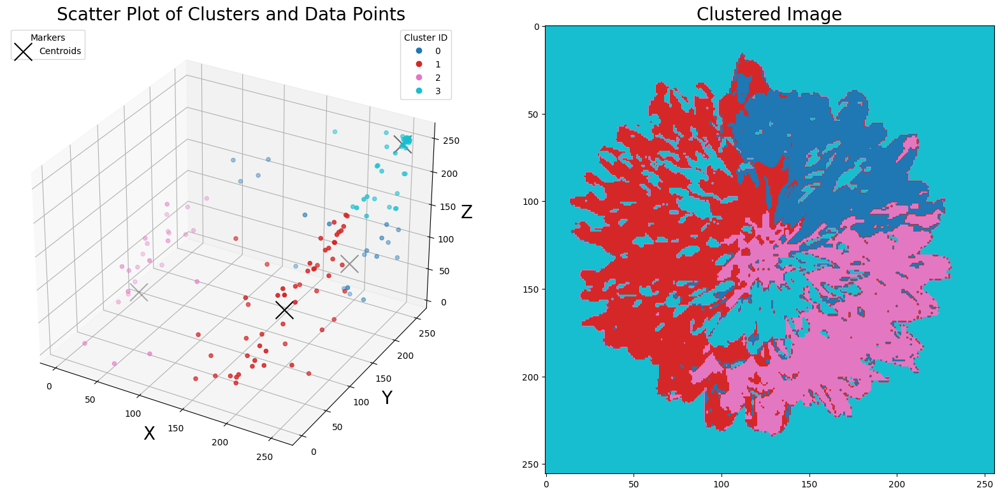

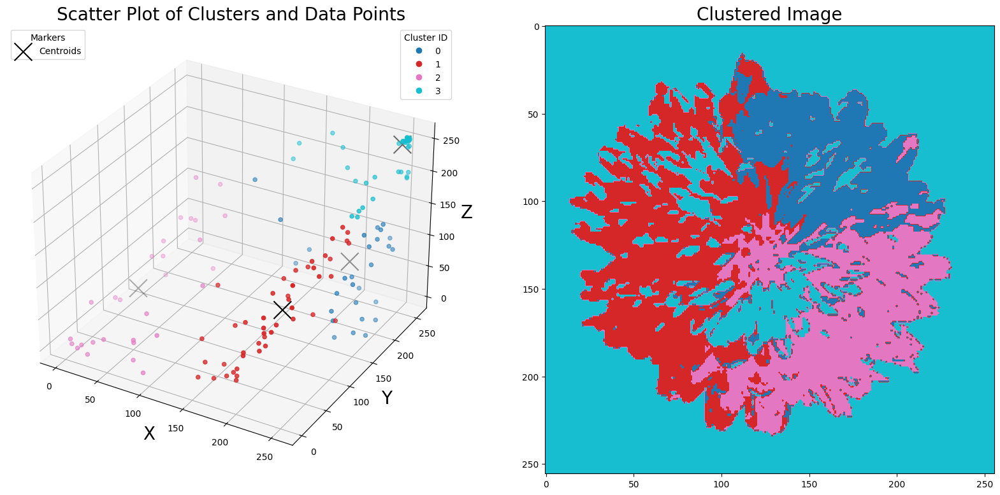

...

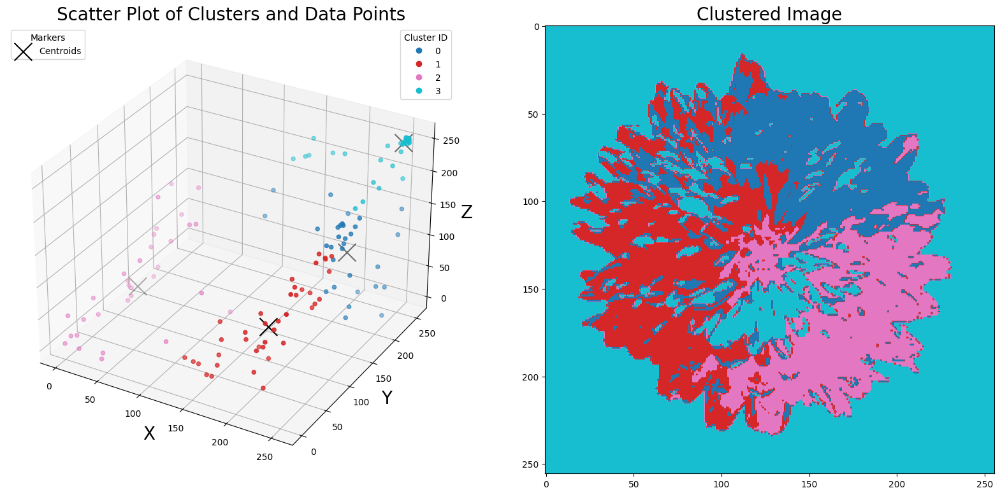

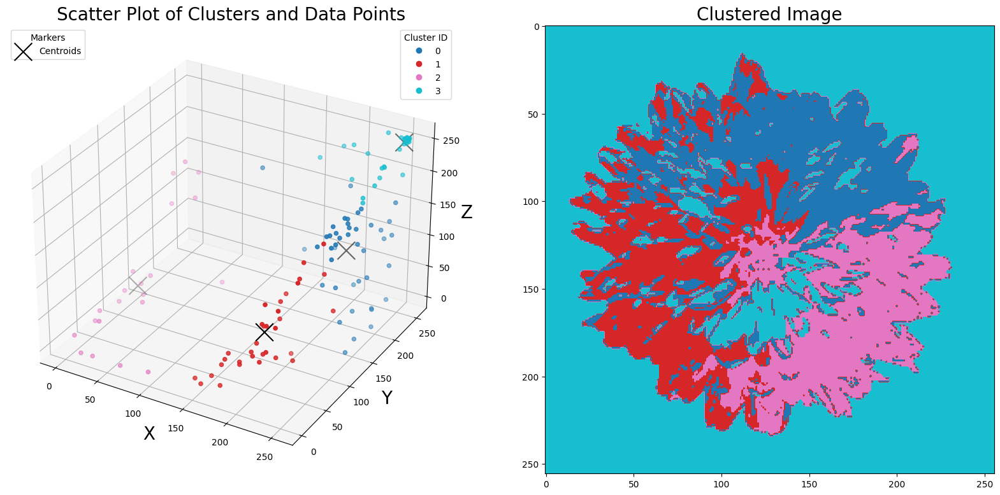

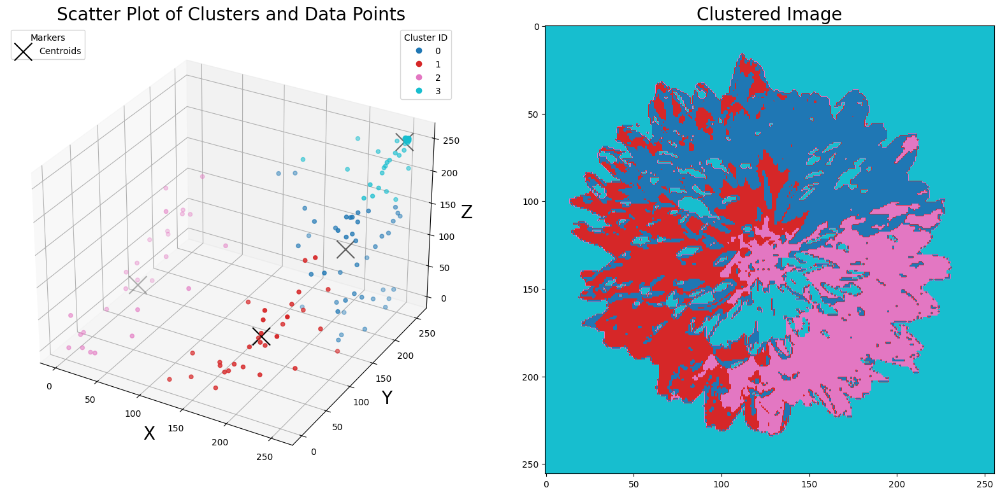

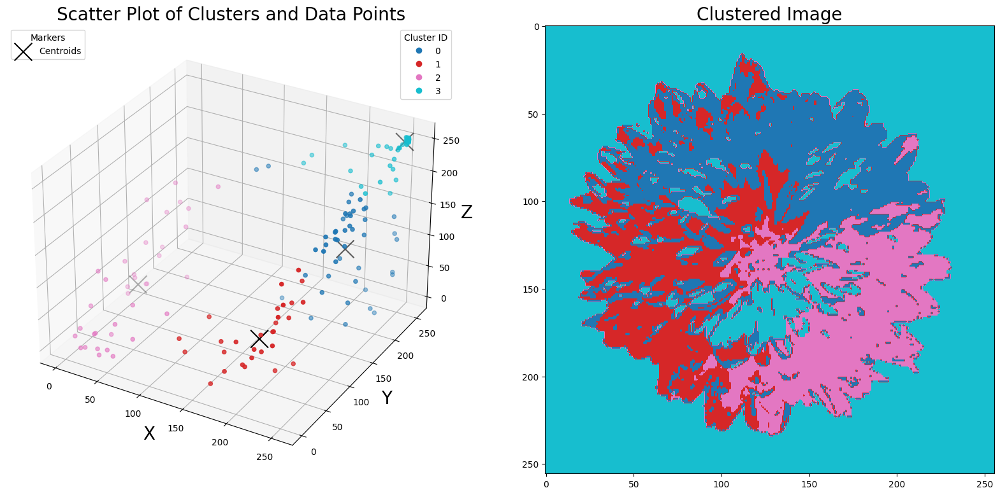

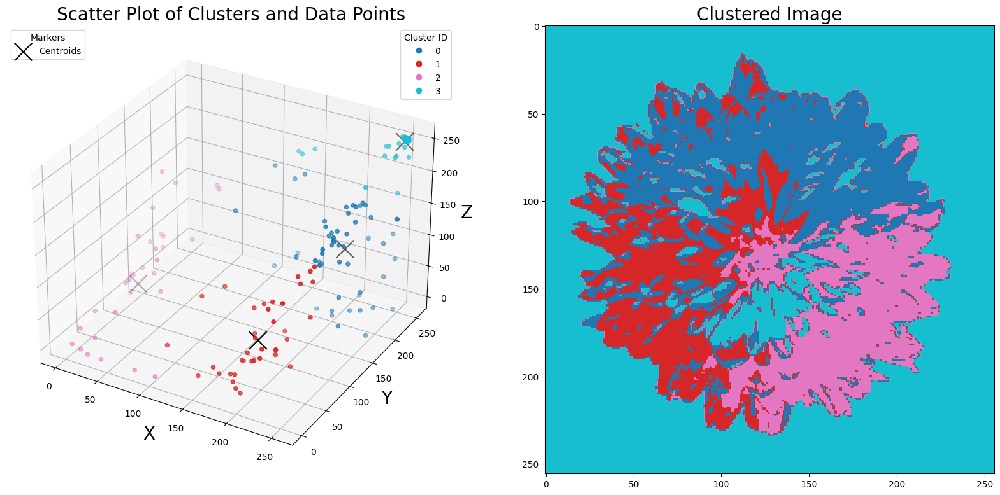

In [ ]:
# We first specify our random seed here
np.random.seed(17)

### Insert your solution here ###

# Initialise the centroids with the kmeans++ method, and run the clustering
kppcentroids = kmeanspp_centroids(img2d, 4)

# Display your results (image)
print(kppcentroids)

sharon_clusterIDs3, sharon_centroids3, sharon_losses3, store_centroids3 = mykMeans_visualize(img2d, kppcentroids, 20, np.shape(img))

<div class="alert alert-block alert-success">

#### Were you able to obtain the same results (the same clustered sharon image) as you did with the random initialization, or do they differ significantly? Were you able to obtain the results faster than with the random initialization? Report your findings, and explain why you think this happens!

1. Yes, I could obtain the same results as compared to the randomly initialized Kmeans
2. In terms of time, both of them took similar timing, since they both same amount of iterations, and in general other than initialization the overall algorithm in both these variants is pretty much similar.
3. Coming to overall explanation of the same, in random initialization, the centroids are initialized randomly and hence are not necessarily optimal. This can lead to slower convergence and hence might require more iterations and as a consequence more computation time for the same.
4. However, with the K++ means initialization, centroids are chosen such that they are well separated and hence can easily be separated into different clusters.
5. Since the algorithm selects centroids probabilistically, the probability that the n+1th centroid will be places near the nth centroid is very low, which ensures that the initial centroids ensemble is very well separated.
6. Hence in general the K++ Means might perform better than the general Kmeans in terms of convergence and the solution quality.

</div>

Now, plot the loss of the two k-Means Clustering methods over the number of iterations. You may want plot the loss curves of the two methods in the same plot for convenience of comparison, and make sure to add an appropriate legend.

In [ ]:
def plot_loss(lossmatarr, labels):

  # number of loss matrices
  n = len(lossmatarr)

  fig, axs = plt.subplots(figsize=(n*7, 7), nrows=int((n+1)/2), ncols=2)
  r, c = 0, 0

  for i in range(n):

    # number of iterations and centroids of each matrix
    T, k = np.shape(lossmatarr[i])

    # Now, the sum of each row indicates the total loss of all centroids at each iteration
    lossplotline = np.sum(lossmatarr[i], axis=1)
    axs[i].set_xlabel('Iterations', size=15)
    axs[i].set_ylabel('Loss Magnitude', size=15)
    axs[i].set_title('Loss Plot %s'%labels[i])
    axs[i].plot(np.arange(1, T+1),lossplotline, label='Loss %s'%labels[i])
    axs[i].grid(1)
    axs[i].legend()

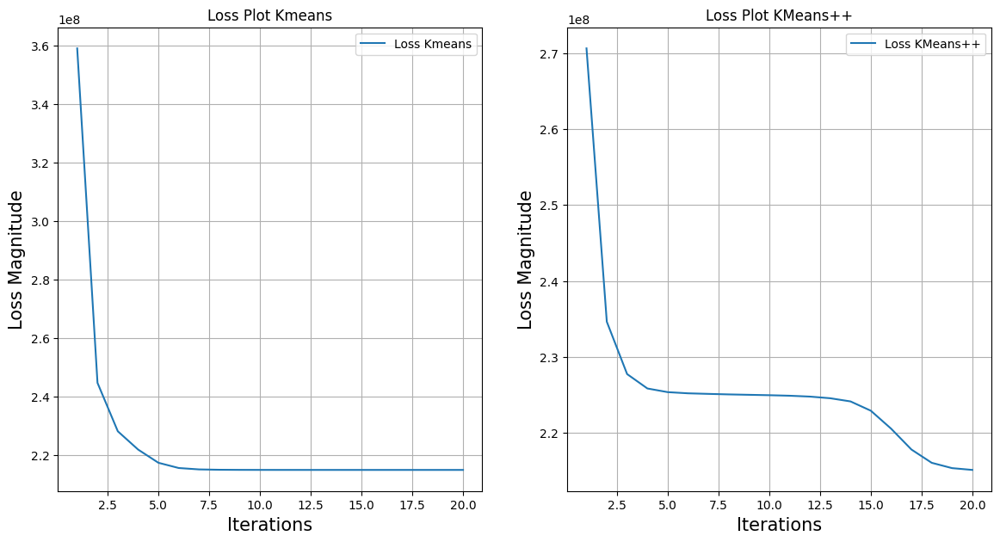

In [ ]:
### Insert your solution here ###

# Display your losses for the random initialization vs. the kmeans++ initialization
plot_loss(np.array([sharon_losses2, sharon_losses3]), labels=['Kmeans', 'KMeans++'])

<div class="alert alert-block alert-success">



#### From your results, discuss the main differences between random initialization and k-Means++ initialization. What do you notice regarding the position of the initial centroids? Which one do you think is better, and why? What do you observe regarding the loss and convergence of both methods? Discuss the pros and cons of the two methods.

1. The initial centroids in the KMeans random initialization variant are placed randomly. Hence there is a chance that the centroids are not very well separated.
2. On the other hand, the initial centroids initialized with K++ Means, they are computed probabilistically. Hence the probability that the n+1th centroid will be close to the nth centroid is very low. This ensures that the initial centroids are very well spaced out.
3. Thsi strategy ensures better convergence in terms of loss function magnitudes and convergence threshold.
4. In the plot it can be seen that the initial loss function in the K++ Means case is lower than that of the random centroids case. Hence we can say that K++ Means is a better initialization method.
5. Again for a high number of K, the initialization will be more computationally expensive than the random initialization.

</div>

<div class="alert alert-block alert-info">

## Tasks 4: GMM: Analysing Data Distributions.

In this task, we will learn about how data can be modelled via its distribution. We first start with a toy example, which helps us understand the concepts.


</div>

### Think about your data like a pro!
You can think of any data sample as a random vector sampled from a distribution that is usually super complicated to model analytically. Nevertheless, there are various methods to estimate the distribution of data.

Let us first look at an intuitive way of thinking about this. Consider a set of images of size $100 \times 100$ representing face images. You can think of any $100 \times 100$ data sample as a $10,000$D random vector sampled from a distribution that we do not know. If you have an image, where you put a mouth on the forehead, this impossible image has a very low-likelihood to be generated from the distribution that YOU DO NOT KNOW. However, a regular image from say your favorite artist has a reasonable likelihood to be generated from that distribution.

We can think about data as a random process that provides us with new tools and algorithms to analyze it.

### The game begins

OK, let us start with a toy example. We assume that our data can be modeled using a GMM with the following parameters:

\begin{align}
    &\mu_1 = -1, \quad \mu_2 = 0, \quad \mu_3 = 0.5, \quad \mu_4 = 2 \;.\\
    &\sigma_1 = 1.0, \quad \sigma_2 = 2.0, \quad \sigma_3 = 3.0, \quad \sigma_4 = 1.0\;.\\
    &\omega_1 = 0.6, \quad \omega_2 = 0.1, \quad \omega_3 = 0.1, \quad \omega_4 =  0.2\;.\\
\end{align}

We pretend that we do not know this is the case and will try below to estimate this distribution. But let's first take a closer look at the GMM itself.

In [ ]:
### Insert your solution here (use numpy arrays to define the provided parameters) ###
means = np.array([-1.0, 0.0, 0.5, 2.0])
stds = np.array([1.0, 2.0, 3.0, 1.0])
weights = np.array([0.6, 0.1, 0.1, 0.2])

### Plot the pdf of a GMM

Recall that a Gaussian distribution is defined as

\begin{align}
    \mathcal{N}(\mathbf{x} | \boldsymbol{\mu}, \boldsymbol{\Sigma}) = \frac{1}{\sqrt{2\pi\sigma^2}} \exp{\Big(-\frac{(x-\mu)^2}{2\sigma^2}\Big)}\;.
\end{align}

The pdf of a GMM with $k$ components is



\begin{align}
    f({x}) &= \sum_{i=1}^k
    \omega_i \mathcal{N}(\mathbf{x} | \boldsymbol{\mu}_i, \boldsymbol{\Sigma}_i) \;.
\end{align}

Here, ${x} \in \mathbb{R}$ (in our case) is the sample we evaluate the pdf at, $\omega_i$ is the weight (i.e., mixing coefficient) of the $i$-th Gaussian component, $\boldsymbol{\mu}_i$ is the mean vector of the $i$-th Gaussian component, and $\boldsymbol{\Sigma}_i$ is the covariance matrix of the $i$-th Gaussian component. The symbol $\mathcal{N}(\cdot|\boldsymbol{\mu}_i,\boldsymbol{\Sigma}_i)$ denotes the probability density function of a multivariate Gaussian distribution with mean vector $\boldsymbol{\mu}_i$ and covariance matrix $\boldsymbol{\Sigma}_i$.

Now, below write a code to plot the pdf of the GMM described above between [-10,10]. If your code is correct, you should see the distribution.

In [ ]:
def normal_pdf(x , mean , sd):
    # The inputs and the outputs of your function should be as follows:
    # Inputs - x : numpy array of linearly spaced points (N x 1)
    #        - mean : an integer value
    #        - sd: an integer value
    # Output - prob_density : a numpy array of probability densities

    ### Insert your solution here ###

    #Step 1: construct vector N
    c1 = 1/np.sqrt(2*np.pi*sd**2)
    c2 = -1*((x-mean)**2)/(2*sd**2)
    prob_density = c1*np.exp(c2)

    return prob_density

# we know the GMM, so plot the PDF of it
# Do this by creating some points in between -10 and 10 via linspace
# Then calculate the likelihood (probabilities) of each point.
# Hint: Look at the formulas above for information how to 'compose' the overall pdf using the components of the mixture.

### Insert your solution here ###
lenx = 200
x = np.linspace(-10, 10, lenx)

# define a function for the Gaussian Mixture Model
def GMM_pdf(x, means, std, weights):

  # means = array of 'n' number of means
  # std   = array of 'n' number of corresponding standard deviations

  normal_pdfs = np.array([normal_pdf(x, means[i], std[i]) for i in range(len(means))])
  GMM_pdf = np.zeros(lenx)
  for i in range(lenx):
    GMM_pdf[i] = np.sum(normal_pdfs[:, i]*weights)

  return GMM_pdf, normal_pdfs

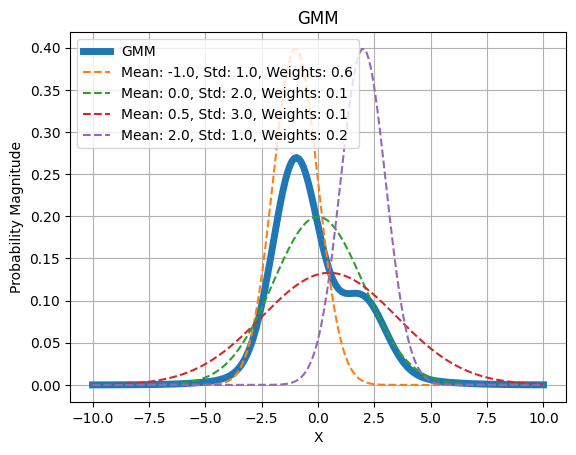

In [ ]:
GMMx, NPDFx = GMM_pdf(x, means, stds, weights)
plt.plot(x, GMMx, linewidth=5, label='GMM')
for i in range(NPDFx.shape[0]):
  plt.plot(x, NPDFx[i], linestyle='--', label='Mean: %s, Std: %s, Weights: %s'%(means[i], stds[i], weights[i]))
plt.xlabel('X')
plt.ylabel('Probability Magnitude')
plt.title('GMM')
plt.legend()
plt.grid()

### Next stop: Sampling from a GMM!

If we have a GMM, to draw samples from it, we can do the following:

1) First, sample from the components according to their weights using the random.choice function from the numpy package.
2) Then, sample from a normal distribution based on the chosen component and according to the parameters of the normal distribution.

Study the code below and convince yourself that what it does is to generate 1,000 samples from the GMM.

In [ ]:
num_samples = 1000

chosen_comp = np.random.choice(a=means.shape[0], size=num_samples, p=weights)

X = np.random.normal(loc=means[chosen_comp], scale=stds[chosen_comp], size=num_samples).reshape(-1,1)

### Hold on, what is a pdf?

<div class="alert alert-block alert-success">

#### Note that in the majority of cases we just have raw data and we do not know the pdf, so check the following figure and explain what it shows.

1. It basically shows the probability distrbution of the data and the data itself on the X axis.
2. If observed closely the density of how the data is dispersed along the X azis varies and is directly proportional to the magnitude of the PDF at that position.
3. Hence we can say, that the data distribution gives an idea of the overall PDF in terms of the packing density.

</div>

_Note_: If you cannot see the displayed image 'Task4_GMM_01_what_is_a_pdf.png', have a look into the provided 'img' folder.

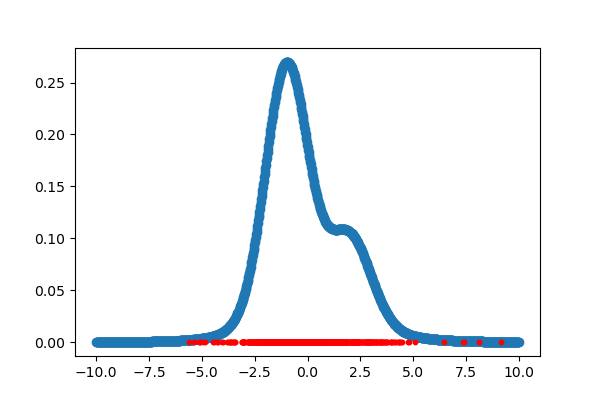

![Task4_GMM_01_what_is_a_pdf.png](img/Task4_GMM_01_what_is_a_pdf.png)

### Can we estimate the pdf from data?

Yes, you can use a GMM to estimate the pdf or you can use a technique called the "Kernel Density Estimation" or KDE to estimate an arbitrary pdf. Check out the following code snippet and explain what you understand from the code below. Also, check the [KDE](https://en.wikipedia.org/wiki/Kernel_density_estimation) on wiki and learn about the algorithm (you can skip how the bandwidth can be set automatically if you want to)

<div class="alert alert-block alert-success">

#### Check out the following code snippet and use your newly acquired knowledge about KDE to explain what you understand from the code below. Also take a look at the plot and explain what you see.

1. The code here makes use of the function called 'KernelDensity' from the sklearn library.
2. The kernel density estimator or abbreviated KDE is a non parametric method for estimating a probability density function based on a set of observations.
3. It uses the Epanechnikov kernel, which is used to compute weights for each of the data points and computr PDF.
4. The bandwidth parameter determines the data points, which will be assigned with non zero weights, or technically it determines the "width" of the kernel function.
5. The code then creates a numpy array of observations and then subsequently fits the KDE to this data.
6. It later superimposes the KDE estimated PDF over the known PDF for comparison.
7. From the figure it can be clearly seen that the KDE estimate is pretty well close enough to the actual distribution, thus pointing to the fact that KDE functions can be used to estimate PDFs from data to a reasonable accuracy.

</div>

In [ ]:
from sklearn.neighbors import KernelDensity

# There is no free-lunch. If you want to use a KDE, you need to identify appropriate hyper-parameters of
# the algorithm, here a kernel and its parameters. We will use the Epanechnikov kernel with a bandwidth of 0.4.
# Feel free to try other values.

kde = KernelDensity(kernel='epanechnikov', bandwidth=0.4).fit(X)

X0 = np.linspace(10, -10, 1000).reshape(-1,1)

Z0_kde = np.exp(kde.score_samples(X0))

_Note_: If you cannot see the displayed image 'Task4_GMM_02_kde.png', have a look into the provided 'img' folder. The kde-results are displayed in purple colour.

![Task4_GMM_02_kde.png](img/Task4_GMM_02_kde.png)

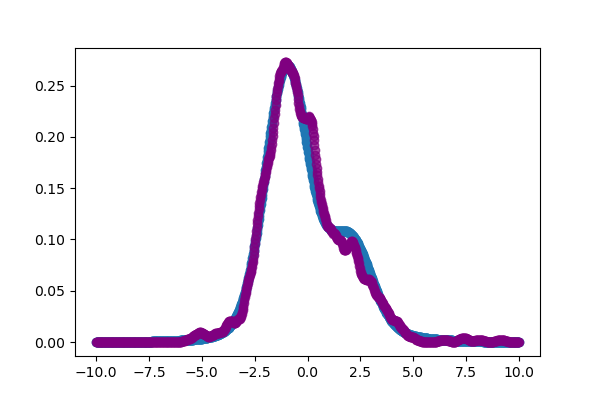

<div class="alert alert-block alert-info">

## Tasks 5: Mean Shift - Data Modelling via its distribution.

In this task, you will apply the concepts learned above for using the [mean shift algorithm](https://ieeexplore.ieee.org/document/1000236)
 for image segmentation.


</div>

### Drumroll, here comes the Mean Shift 🐸

The [Mean Shift (MS)](https://en.wikipedia.org/wiki/Mean_shift) algorithm is a simple algorithm to find the mode of a distribution (what is the mode of a distribution? -> Make sure to look it up if you do not already know). The algorithm is iterative and employs a kernel function to find the modes from samples of a distribution. Let $k(x,z)$ be a kernel function, measuring the similarity between $x$ and $z$ (ie., the higher $k(x,z)$, the more similar are $x$ and $z$). Then using $k(x,z)$, we iterate over

\begin{align}
    m \gets \frac{ \sum_{x_i} k(x_i,m) x_i}{\sum_{x_i} k(x_i,m)} \;.
\end{align}

Then $m$ will be a mode of the distribution where $x_i$ are sampled from. Below, you will develop a simplified version of this algorithm using the so called _flat kernel_

\begin{align}
k_{\text{flat}}(x,z) =
    \begin{cases}
    1 &\text{if} \;\; \|x-z\|^2 \leq h^2\\
    0 &\text{otherwise}
    \end{cases}
\;.
\end{align}

A few comments:
1. $h$ is a hyperparameter of this kernel (we call it the bandwidth of the kernel) and you need to set it properly for the algorithm to work.
2. What this kernel does is simple, if the distance between $x$ and $z$ is less than $h$, then their similarity is considered to be 1, otherwise the similarity between $x$ and $z$ is zero.

_Note_: Make sure to re-use your code from Task 1 to compute the squared distances you need within the kernels to save some implementation time.

In [ ]:
# Implement flat kernel

def flat_kernel(X, centers, distmat, bandwidth=0.1):

    # The inputs and the outputs of your function should be as follows:
    # Inputs - centers : the means (k x 1 numpy array), where k is the number of centres
    #        - X : samples (i x 1 numpy array), where i is the number of samples
    #        - bandwidth : an integer value representing "h" in the equation
    # Output - K : k x i: the kernel output for each distance from the means

    ### Insert your solution here ###

    # Step 1: Create K matrix to store kernel operation results
    kr, kc = distmat.shape
    sqdistmat = distmat**2
    K = np.zeros([kr, kc])

    hsq = bandwidth**2

    # Step 3: Parse the distmat matrix and fill the K matrix
    for j in range(kr):
      for k in range(kc):
        # Only check the condition for 1, because anyways the rest of the entries are already zero! :P
        if sqdistmat[j, k] <= hsq:
          K[j, k] = 1

    return K

In [ ]:
centers = np.transpose(np.array([0, 2, 4, 8]))
samples = np.transpose(np.array([0, 1, 3, 7, 9]))
flat_kernel(samples, centers, dist2c(samples, centers), 2)

array([[1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [0., 1., 1., 0.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.]])

## Playing with the Mean Shift algorithm - your turn!

1. Write the code to perform the mean shift iterations on the data $X$ from the previous task. We will try 100 iterations for this example.
2. Using samples from the GMM, and starting from $m=5$, what will be the mode of the distribution?
3. Now start from $m=-5$. What mode do you converge to new? Do you think MS works on our toy data?
4. Visualise the results for both cases (starting from $m=5$ and  $m=-5$) by showing the respective starting point and result after convergence plotted on top of the data $X$. </br> _Note_: Take a look at the function 'axvline' to use a vertical line for visualising the mode after convergence.

_Hint_: To increase efficiency, you can perform steps 2. and 3. in one go.

In [ ]:
def mean_shift_flat(X, start_point, bandwidth, n_iter=100):

  # create an array to store the means
  store_means = np.zeros(n_iter+1)
  store_means[0] = start_point[0]

  for i in range(n_iter):

    # Step 0: Calculate distance matrix
    distmat = dist2c(X, np.array([store_means[i]]))

    # Step 1: For each entry in data compute the kernel values
    kvals = flat_kernel(X, start_point, distmat, bandwidth)

    # Step 2: Find the weighted average of the data using kvals as the weights
    num = np.sum(X * kvals[:], axis=0)
    den = np.sum(kvals)
    shift = num/den

    # Step 3: Update the start_point with the shifted mean
    start_point = shift

    # Step 4: Store the updated mean
    store_means[i+1] = start_point

  return store_means

In [ ]:
# Now we conduct mean shift analysis on 2 cases m=5 and m=-5
meanshiftm1 = mean_shift_flat(X, np.array([5]), 0.825)
meanshiftm2 = mean_shift_flat(X, np.array([-5]), 1)

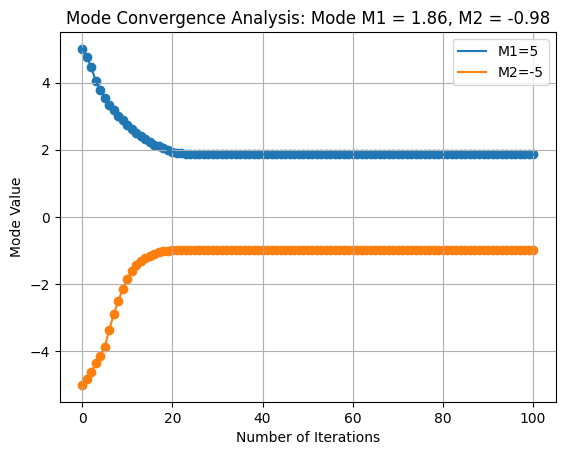

In [ ]:
# Visualize resulrs
plt.plot(np.arange(101), meanshiftm1, label='M1=5')
plt.plot(np.arange(101), meanshiftm2, label='M2=-5')
plt.scatter(np.arange(101), meanshiftm1)
plt.scatter(np.arange(101), meanshiftm2)
plt.legend()
plt.title('Mode Convergence Analysis: Mode M1 = %.2f, M2 = %.2f'%(meanshiftm1[-1], meanshiftm2[-1]))
plt.xlabel('Number of Iterations')
plt.ylabel('Mode Value')
plt.grid()

Plot the starting points(s), the calculated modes and the PDF. Use different colours for the two cases to better interpret the results.

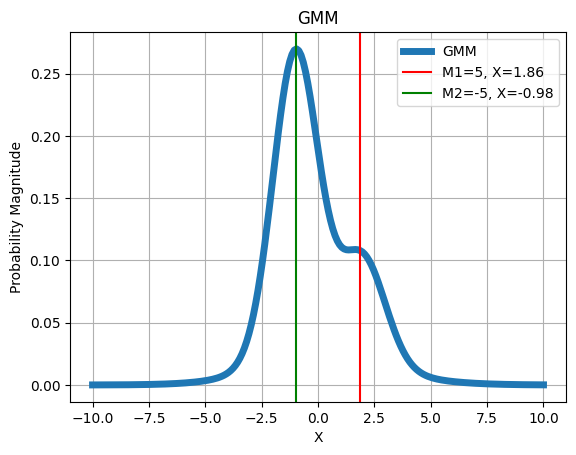

In [ ]:
### Insert your solution here ###
GMMx, NPDFx = GMM_pdf(x, means, stds, weights)
plt.plot(x, GMMx, linewidth=5, label='GMM')
plt.axvline(x=meanshiftm1[-1], color='r', label='M1=5, X=%.2f'%meanshiftm1[-1])
plt.axvline(x=meanshiftm2[-1], color='g',label='M2=-5, X=%.2f'%meanshiftm2[-1])
plt.xlabel('X')
plt.ylabel('Probability Magnitude')
plt.title('GMM')
plt.legend()
plt.grid()

## From flat kernel to Epanechnikov

The Epanechnikov kernel is a popular kernel used in the mean shift algorithm. It is defined as:

\begin{align}
    K(x,z) =
    \begin{cases}
        \frac{3}{4} \Big(1 - \frac{\|x - z\|^2}{h^2} \Big) &\text{if } \|x - z\|^2 \leq h^2\;, \\
        0 &\text{otherwise}
    \end{cases}
\end{align}


The Epanechnikov kernel is a popular choice for the MS algorithm. It has a bounded support, with a flatter shape (compared to a Gaussian kernel), making it less sensitive to outliers.

- Implement the Epanechnikov kernel and repeat the above task with this kernel instead of the flat kernel:

1. Implement meanshift iterations.
2. using samples from the GMM, and starting from $m=5$, what will be mode of the distribution?
3. Now start from $m=-5$. Do you think MS works on our toy data?

In [ ]:
def epanechnikov_kernel(X, centers, distmat, bandwidth=0.1):

    # The inputs and the outputs of your function should be as follows:
    # Inputs - centers : the means (m x 1 numpy array), where m is the number of centres
    #        - X : samples (i x 1 numpy array), where i is the number of samples
    #        - bandwidth : an integer value representing "h" in the equation
    # Output - k : the kernel output for each distance from the means

    ### Insert your solution here ###
    # Step 1: Create K matrix to store kernel operation results
    kr, kc = distmat.shape
    sqdistmat = distmat**2

    K = np.zeros([kr, kc])

    hsq = bandwidth**2

    # Step 3: Parse the distmat matrix and fill the K matrix
    for j in range(kr):
      for k in range(kc):
        # Only check the condition for 1, because anyways the rest of the entries are already zero! :P
        if sqdistmat[j, k] <= hsq:
          K[j, k] = 0.75*(1 - (sqdistmat[j, k]/hsq))

    return K

In [ ]:
def mean_shift_epanechnikov(X, start_point, bandwidth, n_iter=100):

  # create an array to store the means
  store_means = np.zeros(n_iter+1)
  store_means[0] = start_point[0]

  for i in range(n_iter):

    # Step 0: Calculate distance matrix
    distmat = dist2c(X, np.array([store_means[i]]))

    # Step 1: For each entry in data compute the kernel values
    kvals = epanechnikov_kernel(X, start_point, distmat, bandwidth)

    # Step 2: Find the weighted average of the data using kvals as the weights
    num = np.sum(X * kvals[:], axis=0)
    den = np.sum(kvals)
    shift = num/den

    # Step 3: Update the start_point with the shifted mean
    start_point = shift

    # Step 4: Store the updated mean
    store_means[i+1] = start_point

  return store_means

Plot the starting points(s), the calculated modes and the PDF. Use different colours for the two cases to better interpret the results.

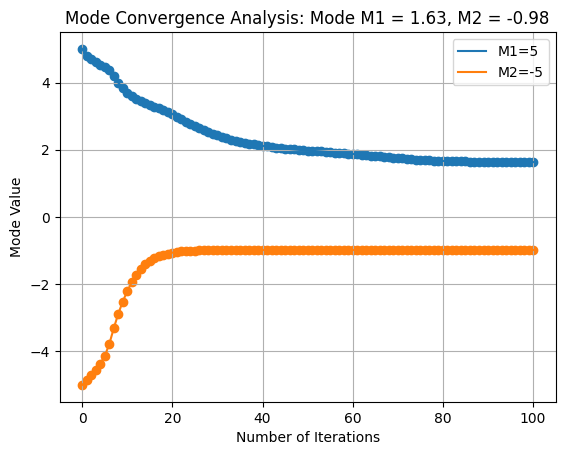

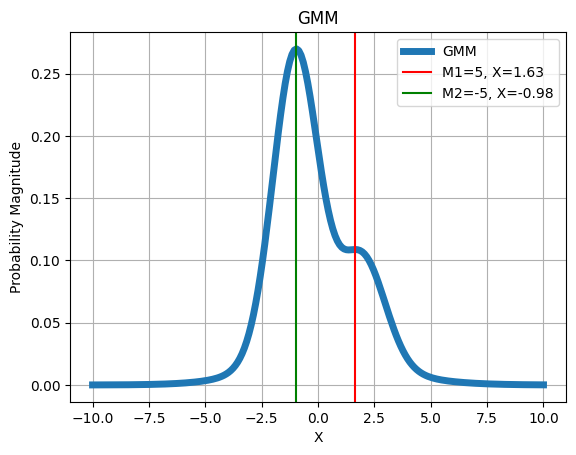

In [ ]:
# Now we conduct mean shift analysis on 2 cases m=5 and m=-5
meanshiftepam1 = mean_shift_epanechnikov(X, np.array([5]), 0.7)
meanshiftepam2 = mean_shift_epanechnikov(X, np.array([-5]), 1.2)

# Visualize resulrs
plt.plot(np.arange(101), meanshiftepam1, label='M1=5')
plt.plot(np.arange(101), meanshiftepam2, label='M2=-5')
plt.scatter(np.arange(101), meanshiftepam1)
plt.scatter(np.arange(101), meanshiftepam2)
plt.legend()
plt.title('Mode Convergence Analysis: Mode M1 = %.2f, M2 = %.2f'%(meanshiftepam1[-1], meanshiftepam2[-1]))
plt.xlabel('Number of Iterations')
plt.ylabel('Mode Value')
plt.grid()

### Insert your solution here ###
GMMx2, NPDFx2 = GMM_pdf(x, means, stds, weights)
plt.figure()
plt.plot(x, GMMx2, linewidth=5, label='GMM')
plt.axvline(x=meanshiftepam1[-1], color='r', label='M1=5, X=%.2f'%meanshiftepam1[-1])
plt.axvline(x=meanshiftepam2[-1], color='g',label='M2=-5, X=%.2f'%meanshiftepam2[-1])
plt.xlabel('X')
plt.ylabel('Probability Magnitude')
plt.title('GMM')
plt.legend()
plt.grid()

### Apply Mean-Shift to Segment an Image

Now, we can use the MS algorithm to segment an image. To do this, we will use the implementation of the [sklearn package](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.MeanShift.html) (you will soon see why). Here is what we will do:

1. Given the sharon image, we first apply k-means on pixel colors in two different spaces, RGB and LAB (use opencv for the color conversion). Since we have no idea how many clusters might be in the image, pick a guess (maybe counting the number of 'dominant' colors you can see)

2. Use the MS algorithm and tune its hyperparameters to achieve a reasonable result.

3. How many colors does MS find in your image? If you fancy, repeat this with an image of your own choice and discuss the result.


In [ ]:
from sklearn.cluster import MeanShift
from sklearn import cluster

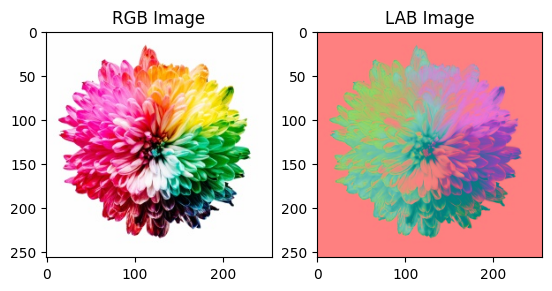

In [ ]:
# Load the image and convert it to both RGB and LAB colour space; Visualise your results!
img = cv2.imread('sharon.jpg') # sharon

## Convert to RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

## Convert to LAB
img_lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)

## Visualise the results
fig, ax = plt.subplots(1, 2)
ax[0].imshow(img_rgb)
ax[0].set_title('RGB Image')
ax[1].imshow(img_lab)
ax[1].set_title('LAB Image');

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


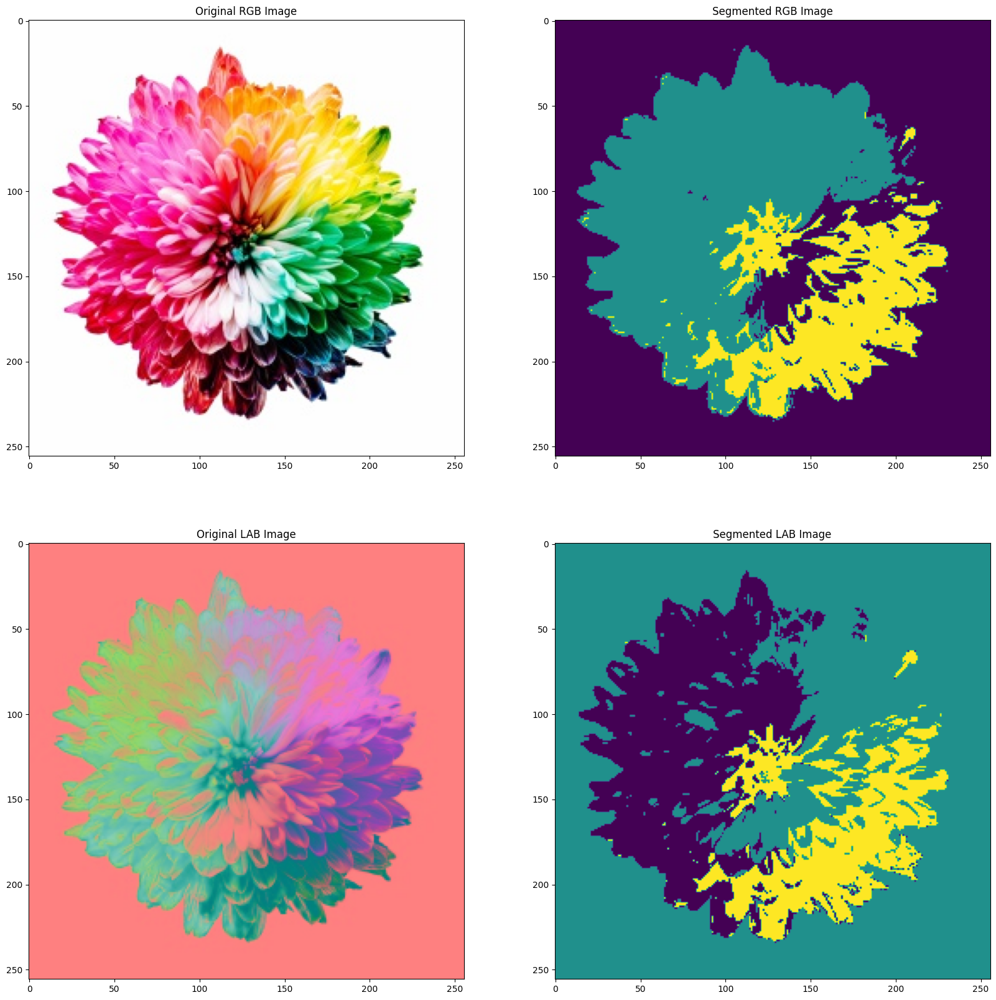

In [ ]:
# Run the k-means clustering algorithm from the 'cluster' package of 'sklearn' (imported above) on both images and visualise your results

# Step 1: Reshape the Images
img_rgb2 = img_rgb.reshape((-1,3))
img_lab2 = img_lab.reshape((-1, 3))

# Step 2: Create the cluster object
kmcluster = cluster.KMeans(n_clusters=3)

# Now, we fit the clusters object to the created images
fit_rgb = kmcluster.fit(img_rgb2)
fit_lab = kmcluster.fit(img_lab2)

# Now, we use sklearn's inbuilt functions to predict the cluster labels
label_rgb = kmcluster.predict(img_rgb2)
label_lab = kmcluster.predict(img_lab2)

# Reshape the predicted labels into the original shapes
label_rgb = label_rgb.reshape(img_rgb.shape[:2])
label_lab = label_lab.reshape(img_lab.shape[:2])

# Now, display the processed and original images
fig, ax = plt.subplots(2, 2, figsize=(20, 20))
ax[0, 0].imshow(img_rgb)
ax[0, 0].set_title('Original RGB Image')
ax[0, 1].imshow(label_rgb)
ax[0, 1].set_title('Segmented RGB Image')
ax[1, 0].imshow(img_lab)
ax[1, 0].set_title('Original LAB Image')
ax[1, 1].imshow(label_lab)
ax[1, 1].set_title('Segmented LAB Image');

### Now, let's do Mean-Shift Clustering

Note that to speed up the process, we suggest you randomly select around 500 datapoints from the image and fit the model using this subset of datapoints. </br> You can then 'predict' the corresponding cluster centers (labels) for all other datapoints using this fitted MeanShift model. Remember you can look at the sklearn documentation for more information about the MeanShift() module </br>

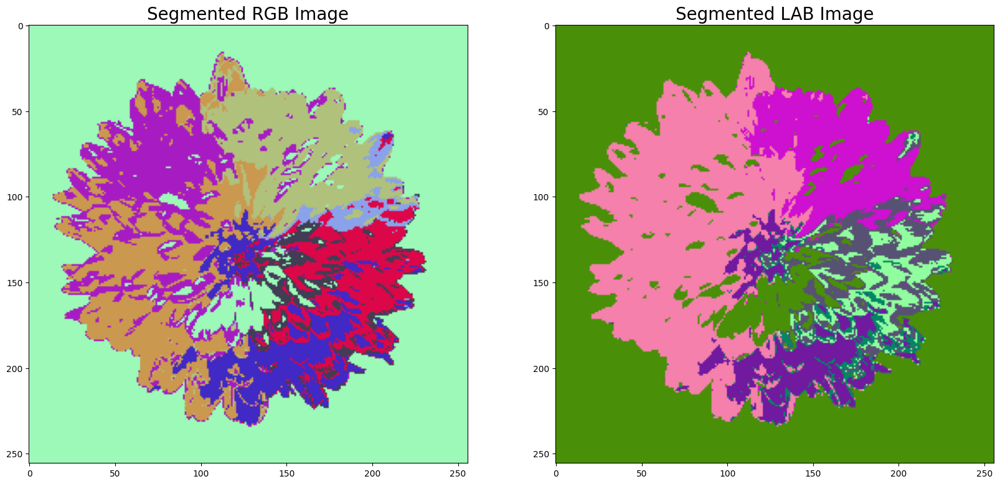

In [ ]:
# MeanShift Clustering for RGB and LAB image
# first, we import some functions from sklearn.cluster

# We are setting a fixed seed here
np.random.seed(17)

num_rand_samples = 500
h, w = img.shape[:2]
rnd_idx = np.random.choice(h*w,num_rand_samples)

# Step -1: Create an array of 500 co-ordinates which can be used to sample the imae
sampled_img_rgb = img_rgb2[rnd_idx]
sampled_img_lab = img_lab2[rnd_idx]

# Step 0: Make a rough guess about the bandwidth parameter to be used, or use inbuilt skicit learn functions
## Here, we dont need to reshape the images, because we already ahve them reshaped in earlier code
bandwidth_rgb = cluster.estimate_bandwidth(sampled_img_rgb)
bandwidth_lab = cluster.estimate_bandwidth(sampled_img_lab)

# Step 1: Create mean shift clustering object in Sklearn
mscluster_rgb = MeanShift(bandwidth=bandwidth_rgb)
mscluster_lab = MeanShift(bandwidth=bandwidth_lab)

# Step 2: Now fit the model
mscluster_rgb_fit = mscluster_rgb.fit(sampled_img_rgb)
mscluster_lab_fit = mscluster_lab.fit(sampled_img_lab)

# Step 3: Obtain the cluster labels and centers
mscluster_rgb_labels = mscluster_rgb_fit.predict(img_rgb2)
mscluster_lab_labels = mscluster_lab_fit.predict(img_lab2)

mscluster_rgb_centers = mscluster_rgb_fit.cluster_centers_
mscluster_lab_centers = mscluster_lab_fit.cluster_centers_

# Step 4: Now, reshape the labels with the original image size
mscluster_rgb_labels2 = mscluster_rgb_labels.reshape(img_rgb.shape[:2])
mscluster_lab_labels2 = mscluster_lab_labels.reshape(img_lab.shape[:2])

# Step 5: To visualize the images, we need to create a new image and then color the pixels according to the clusters
# we use the set function to only pick the unique elements
num_rgb = len(set(mscluster_rgb_labels))
num_lab = len(set(mscluster_lab_labels))

## create dummy images
segmented_rgb = np.zeros_like(img_rgb)
segmented_lab = np.zeros_like(img_lab)

## Now color each of the cluster in random colors
for i in range(num_rgb):
  segmented_rgb[mscluster_rgb_labels2 == i] = np.random.randint(0, 255, size=(1, 3))
for j in range(num_lab):
  segmented_lab[mscluster_lab_labels2 == j] = np.random.randint(0, 255, size=(1, 3))

# Step 6: Now plot the images
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(segmented_rgb)
ax[1].imshow(segmented_lab)
ax[0].set_title('Segmented RGB Image', size=20)
ax[1].set_title('Segmented LAB Image', size=20);

### Insert your solution here ###

### Visualise them all!

Visualise all four resulting clustered images: k-Means RGB & LAB, as well as mean shift RGB & LAB. </br> _Hint_: Make sure to display all results in the RGB space (and convert appropriately).

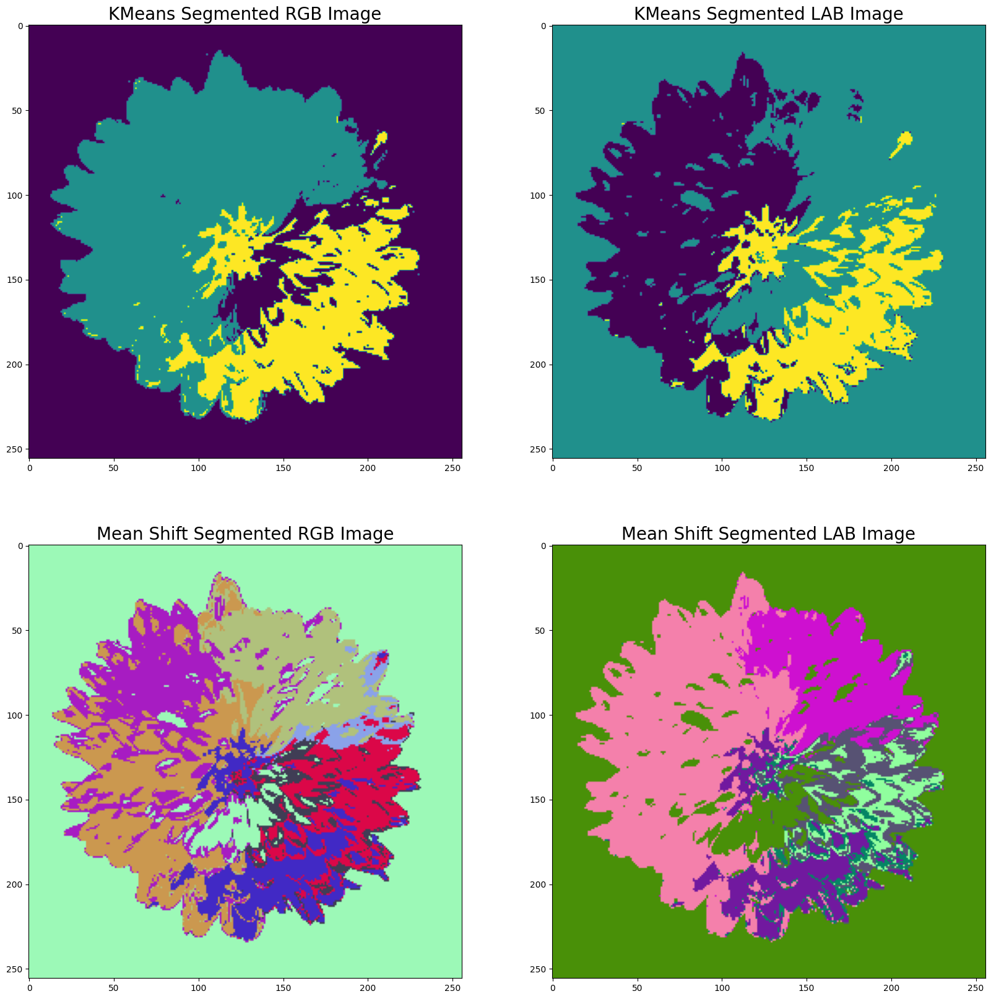

In [ ]:
# Visualising all cluster results

fig, ax = plt.subplots(2, 2, figsize=(20, 20))
ax[0, 0].imshow(label_rgb)
ax[0, 0].set_title('KMeans Segmented RGB Image', size=20)
ax[0, 1].imshow(label_lab)
ax[0, 1].set_title('KMeans Segmented LAB Image', size=20);
ax[1, 0].imshow(segmented_rgb)
ax[1, 1].imshow(segmented_lab)
ax[1, 0].set_title('Mean Shift Segmented RGB Image', size=20)
ax[1, 1].set_title('Mean Shift Segmented LAB Image', size=20);

### Insert your solution here ###

<div class="alert alert-block alert-success">



#### What do you notice about the mean-shift algorithm compared to the k-means for the RGB and LAB images?

1. Primarily by observing the images above, I think the mean shift algorithm creates much more clusters as compared to Kmeans.
2. However it should be considered that the KMeans algorithm is a parametric algorithm, as in we have defined the number of clusters based on a heuristic guess we made, looking at the image. Hence the Kmeans algorithm doesn't really have freedom to choose the number of clusters.
3. Mean shift on the other hand is a non parametric algorithm and hence can choose the number of clusters.
4. LAB colorspace is a perceptually uniform color space, i.e the differences in colors in the LAB space exactly correspond to the differences in the colors the human eye notices.
5. The meanshift algorithm performs better on the LAB images rather than the RGB images.

</div>

<div class="alert alert-block alert-info">

## Tasks 6: Comparison between k-Means, k-Means++ Initialization and Mean-Shift algorithm.

In this task, you will visualize the effects of random initialization, k-Means++ initialization and the Mean Shift algorithm by plotting the final clustering result of all data points together with their **final** cluster centers (using 3D scatter plots, similar to Task 2). </br> For the two k-means methods, additionally plot their **initial** centroids!


</div>

In [ ]:
# We are setting a fixed seed here
np.random.seed(17)

#### Use random initialization to cluster the pixels of the *sharon.jpg* image.

In [ ]:
### Insert your solution here ###

# Randomly initialize the centroids and obtain the clustering results -- you can choose T=20 iterations to start with

img = cv2.imread('sharon.jpg')
# Initialize centroids, perform k-means for 20 iterations and visualise the clustered colour image# before that, first reshape the image

# Define a fixed random seed for repeatability
np.random.seed(17)

### Insert your solution here ###
# Initialize centroids, perform k-means for 20 iterations and visualise the clustered colour image
# before that, first reshape the image

# Reshaping the image into a 2D array of pixels and 3 color values (RGB)
img2d = img.reshape((-1,3))

# Convert to float type
img2d = np.float32(img2d)

sharon_centroids = random_centroids(img2d, 4)

sharon_clusterIDs, sharon_centroids, sharon_losses, store_centroids = mykMeans(img2d, sharon_centroids, 20, np.shape(img))

<ipython-input-16-9c6f57246cb1>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10', k);


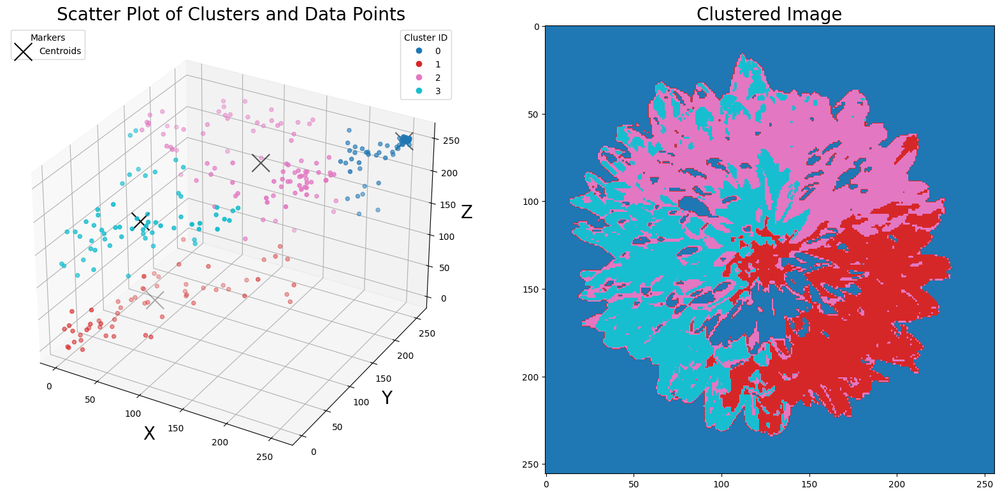

In [ ]:
sample = np.random.choice(np.arange(img2d.shape[0]), size=500, replace=False)
visualize(img2d, sharon_clusterIDs, sharon_centroids, sample, np.shape(img))


#### Use k-Means++ initialization to cluster the pixels of the *sharon.jpg* image.

In [ ]:
### Insert your solution here ###

# Initialize the centroids via k-Means++ and obtain the clustering results -- you can choose T=20 iterations to start with
# Initialise the centroids with the kmeans++ method, and run the clustering

# We first specify our random seed here
np.random.seed(17)

### Insert your solution here ###

# Initialise the centroids with the kmeans++ method, and run the clustering
kppcentroids = kmeanspp_centroids(img2d, 4)

# Display your results (image)
print(kppcentroids)

sharon_clusterIDs3, sharon_centroids3, sharon_losses3, store_centroids3 = mykMeans(img2d, kppcentroids, 20, np.shape(img))

[171. 160. 255.]
[[171. 160. 255.]
 [193. 116. 227.]
 [  3.   1.  13.]
 [254. 254. 254.]]


<ipython-input-16-9c6f57246cb1>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10', k);


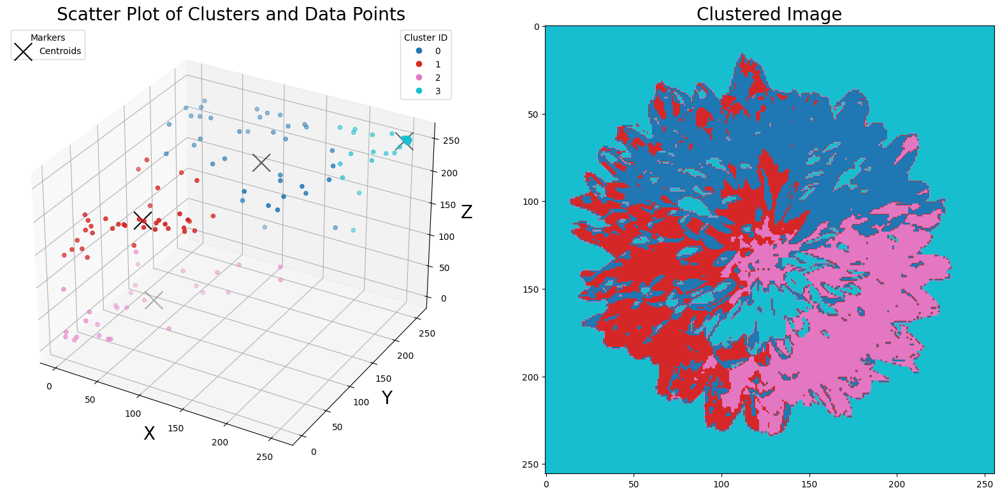

In [ ]:
sample = np.random.choice(np.arange(img2d.shape[0]), size=250, replace=False)
visualize(img2d, sharon_clusterIDs3, sharon_centroids3, sample, np.shape(img))

#### Use Mean Shift to cluster the pixels of the *sharon.jpg* image.

In [ ]:
### Insert your solution here ###

# Apply the mean-shift algorithm to cluster the pixels of the sharon.jpg image
# We already have applied the same above in Task 5, and hence can be reused

Plot the generated centroids from each initialization method together with the final clustering result of the data points (by using corresponding centroid colours). You may want generate a side-by-side plot for easier comparison of the three methods (e.g. via subplots). Also make sure to clearly label your methods as well as axes in the plot.

<ipython-input-16-9c6f57246cb1>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10', k);


Text(0.5, 1.0, 'Segmented Image Mean Shift')

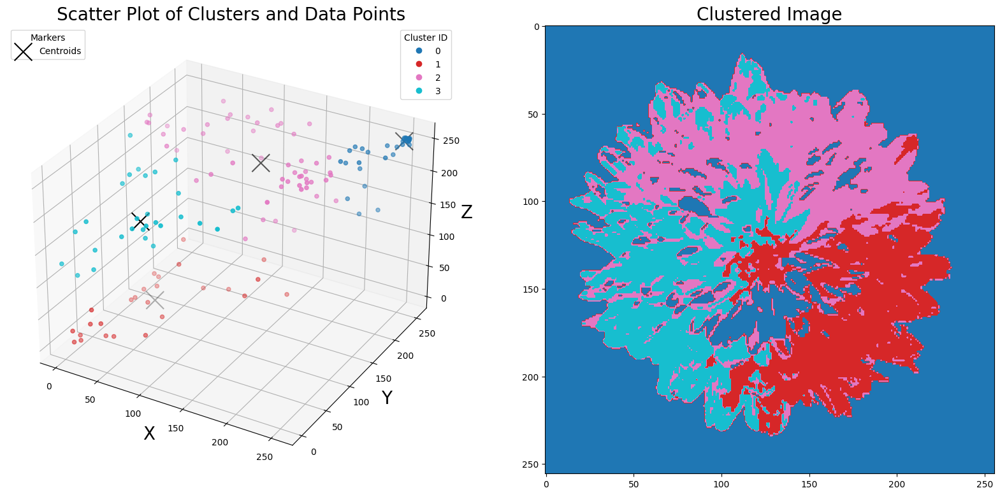

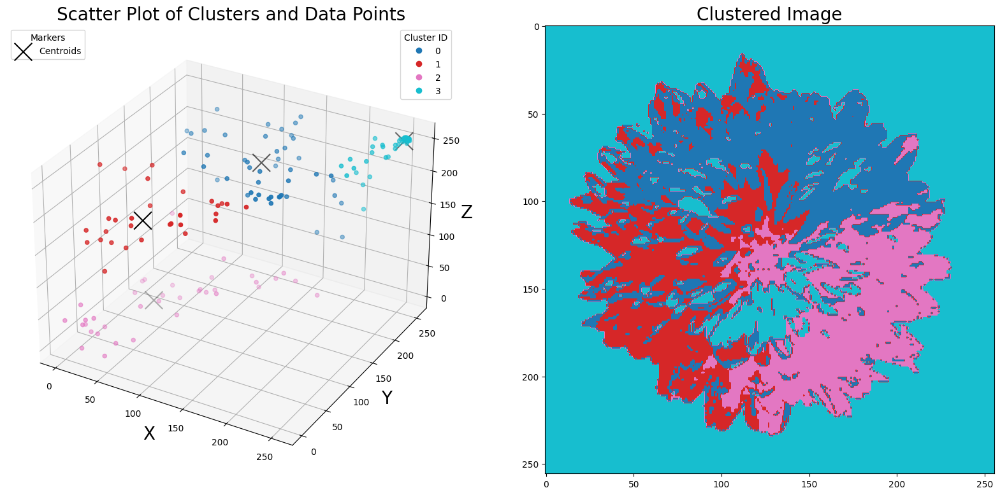

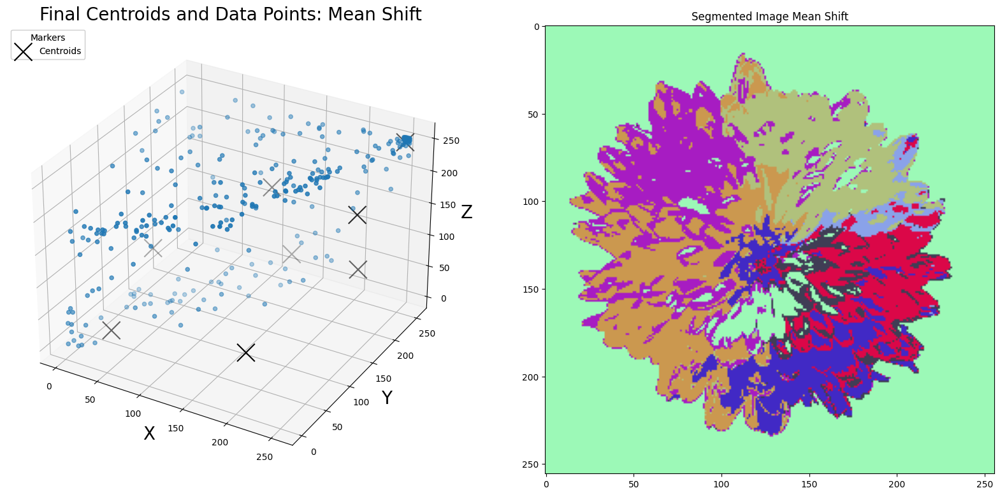

In [ ]:
### Insert your solution here ###

# create a universal figure
#ax, fig = plt.subplots(3, 3, figsize=(30, 30))

# Create (sub)plot to display the final centroids and final cluster results obtained with Random Initialization, as well as the initial centroids
sample = np.random.choice(np.arange(img2d.shape[0]), size=250, replace=False)
visualize(img2d, sharon_clusterIDs, sharon_centroids, sample, np.shape(img))

# Create (sub)plot to display the final centroids and final cluster results obtained with k-Means++ Initialization, as well as the initial centroids
sample = np.random.choice(np.arange(img2d.shape[0]), size=250, replace=False)
visualize(img2d, sharon_clusterIDs3, sharon_centroids3, sample, np.shape(img))

# Create (sub)plot to display the final centroids and final cluster results obtained with the Mean Shift Algorithm
fig = plt.figure(figsize=(20, 10))
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax2 = fig.add_subplot(1, 2, 2)

ms_sample = np.random.choice(np.arange(img2d.shape[0]), size=500, replace=False)
ms_data = img2d[ms_sample]

scatter_plot = ax1.scatter(ms_data[:, 0], ms_data[:, 1], ms_data[:, 2])
centroids_plot = ax1.scatter(mscluster_rgb_centers[:, 0], mscluster_rgb_centers[:, 1], mscluster_rgb_centers[:, 2], s=400, c='black', marker='x')
#legend1 = ax1.legend(*scatter_plot.legend_elements(), loc="upper right", title="Cluster ID")
legend2 = ax1.legend([centroids_plot], ['Centroids'], loc="upper left", title="Markers")
ax1.set_title('Final Centroids and Data Points: Mean Shift', size=20)
ax1.add_artist(legend2)
ax1.set_xlabel('X', size=20)
ax1.set_ylabel('Y', size=20)
ax1.set_zlabel('Z', size=20)
#ax1.scatter(mscluster_rgb_centers[:, 0], mscluster_rgb_centers[:, 1], mscluster_rgb_centers[:, 2], s=200, marker='x')
#ax1.set_title('Final Centroids Mean Shift')
ax2.imshow(segmented_rgb)
ax2.set_title('Segmented Image Mean Shift')

<div class="alert alert-block alert-success">



#### What do you notice about the mean-shift clustering compared to the k-means algorithms? And how do the two k-means initializations differ?

1. The two Kmeans initializations don't differ a lot, in terms of convergence the K++ means variant is better, however since we explicitly define that the number of clusters as well the maximum number of iterations in both the initialization variants they pretty much produce similar results.

2. The centroids in the random initialization are not well separated initially as compared to the K++ variant, however with ongoing iterations, both variants converge towards almost close positions for centrids.

2. The Mean shift algorithm on the other hand produces more clusters as compared to the Kmeans algorithm.

</div>

Also observe the location of the initial centroids of random initialization and the K-means++ method!

[183.  77. 230.]


Text(0.5, 0, 'Z')

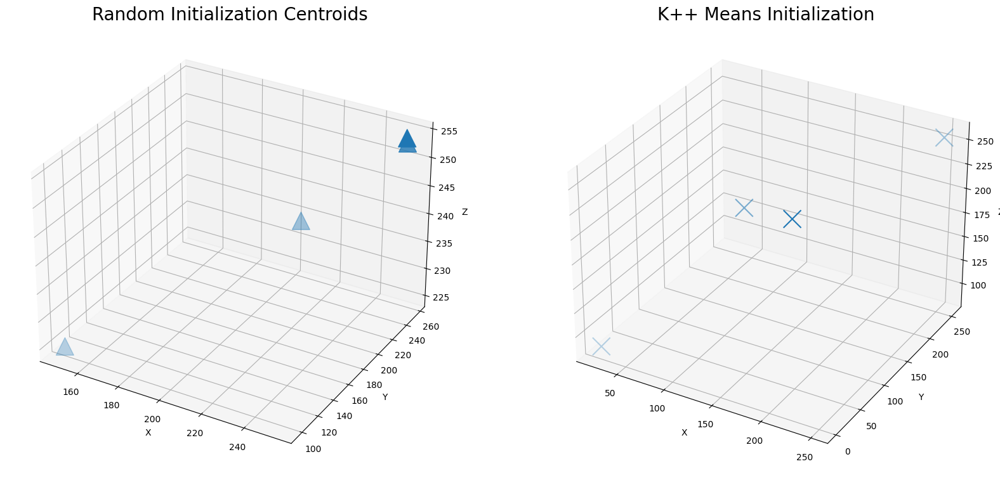

In [ ]:
fig = plt.figure(figsize=(20, 10))
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax2 = fig.add_subplot(1, 2, 2, projection='3d')

rc, kc = random_centroids(img2d, 4), kmeanspp_centroids(img2d, 4)

ax1.scatter(rc[:, 0], rc[:, 1], rc[:, 2], s=400, marker='^')
ax2.scatter(kc[:, 0], kc[:, 1], kc[:, 2], s=400, marker='x')
ax1.set_title('Random Initialization Centroids', size=20)
ax2.set_title('K++ Means Initialization', size=20)
ax1.set_xlabel('X')
ax2.set_xlabel('X')
ax1.set_ylabel('Y')
ax2.set_ylabel('Y')
ax1.set_zlabel('Z')
ax2.set_zlabel('Z')